## $3^{η}$ ΕΡΓΑΣΤΗΡΙΑΚΗ ΑΣΚΗΣΗ 
## Βαθιά Μάθηση



## Oμάδα 11
### Καράμπελα Θεοφανία $ $ ΑΜ: <font color='royalblue'>03117081</font> 
### Κουνούδης Δημήτριος $ $  ΑΜ: <font color='royalblue'>03117169</font> 
### Τσακανίκα Χριστίνα $ $ ΑΜ: <font color='royalblue'>03117012</font> 


In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import gensim.downloader
import collections
import random
import numpy as np
import os
import time
import json
from PIL import Image
import pandas as pd
import re
import nltk
from nltk.translate.bleu_score import SmoothingFunction
!pip install tqdm
from tqdm import tqdm

#### Στα παρακάτω βήματα ακολουθούμε επακριβώς τη διαδικασία του tutorial "https://www.tensorflow.org/tutorials/text/image_captioning", για τη βάση δεδομένων *flickr30k-images-ecemod*. Το μοντέλο που χρησιμοποιούμε είναι το *InceptionV3*.

In [2]:
# Download image files
image_zip = tf.keras.utils.get_file('flickr30k-images-ecemod.zip',
                                      cache_subdir=os.path.abspath('.'),
                                      origin='https://www.dropbox.com/s/efqe8131slq1zah/flickr30k-images-ecemod.zip?dl=1',
                                      extract=True)
os.remove(image_zip)

4376395776/4376381805 [==============================] - 150s 0us/step


In [3]:
# Download train captions file
train_captions_file = tf.keras.utils.get_file('train_captions.csv',
                                           cache_subdir=os.path.abspath('.'),
                                           origin='https://www.dropbox.com/s/qqrsitwecf7fjd3/train_captions.csv?dl=1',
                                           extract=False)

# Download test files list
test_images_file = tf.keras.utils.get_file('test_images.csv',
                                           cache_subdir=os.path.abspath('.'),
                                           origin='https://www.dropbox.com/s/ahtgk6isemsqldf/test_images.csv?dl=1',
                                           extract=False)

40960/29242 [==========================================] - 0s 2us/step


#### Τα περιεχόμενα του *flickr30k-images-ecemod* είναι τα directories *image_dir* το οποίο διαθέτει 31.783 εικόνες, το *train_captions.csv* που περιλαμβάνει 148.915 captions για τις παραπάνω εικόνες και το *test_images.csv* που περιέχει τα 2.000 ονόματα εικόνων του *image_dir* δίχως captions.

In [4]:
#path of the images:
path = '/kaggle/working/image_dir/'
os.listdir('/kaggle/working/')

['test_images.csv',
 'image_dir',
 '__notebook_source__.ipynb',
 'train_captions.csv']

In [5]:
test  = pd.read_csv("test_images.csv", header=None)
train = pd.read_csv("train_captions.csv", delimiter="|", header=None)

In [6]:
train.columns = ['image', 'caption_number', 'caption']
train['caption'] = train['caption'].str.lstrip()


In [12]:
image_path_to_caption = collections.defaultdict(list)
for i in range(len(train['caption'])):
    caption = '<start> ' + train['caption'][i] + ' <end>'
    image_path = path+train['image'][i]
    image_path_to_caption[image_path].append(caption)

#### Προκειμένου να επιτύχουμε ταχύτερους χρόνους επεξεργασίας δεδομένων καθώς και για την αποφυγή runtime errors, επιλέγουμε τα 6000 πρώτα δείγματα εικόνων.

In [13]:
image_paths = list(image_path_to_caption.keys())
random.shuffle(image_paths)

train_image_paths = image_paths[:6000]
print(len(train_image_paths))

train_captions = []
img_name_vector = []

for i in train_image_paths:
    caption_list = image_path_to_caption[i]
    train_captions.extend(caption_list)
    img_name_vector.extend([i] * len(caption_list))

6000


<start> Men in orange vests and hard hats . <end>


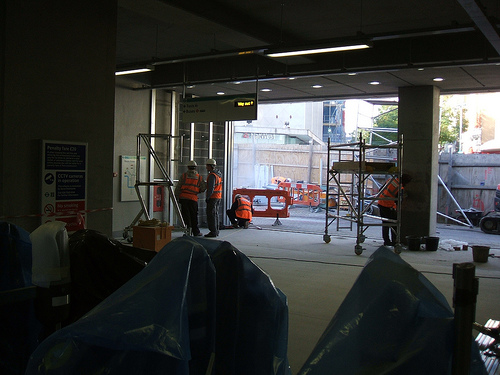

In [14]:
#show a picture
print(train_captions[63])
Image.open(img_name_vector[63])

#### Preprocess the images using InceptionV3

#### To InceptionV3 model είναι προεκπαιδευμένο στο Imagenet και δέχεται τις εικόνες διαστάσεων 299x299. Με την *preprocess_input* το κάθε πίξελ της εικόνας λαμβάνει τιμή εντός του διαστήματος [-1,1].

In [15]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.keras.layers.Resizing(299, 299)(img)
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path

#### Initialize InceptionV3  and load the pretrained Imagenet weights

In [16]:
image_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

2022-03-02 04:53:03.361289: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-02 04:53:03.483588: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-02 04:53:03.484356: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-02 04:53:03.485946: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

87924736/87910968 [==============================] - 0s 0us/step


#### Caching the features extracted from InceptionV3

In [18]:
# Get unique images
encode_train = sorted(set(img_name_vector))

os.mkdir('/kaggle/working/inception/')

# Feel free to change batch_size according to your system configuration
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.AUTOTUNE).batch(16)

for img, path in tqdm(image_dataset):
    batch_features = image_features_extract_model(img)
    batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

    for bf, p in zip(batch_features, path):
        path_of_feature = p.numpy().decode("utf-8")
        path_of_feature = path_of_feature.split('/')[-1]
        path_of_feature = '/kaggle/working/inception/' + path_of_feature
        np.save(path_of_feature, bf.numpy())

100%|██████████| 375/375 [01:21<00:00,  4.58it/s]


#### Preprocess and tokenize the captions

#### Η συνάρτηση TextVectorization μετατρέπει κάθε caption stirng σε μια ακουλθία ακεραίων αριθμών. Έπειτα, με τις παραμέτρους που της θέτουμε, σχηματίζει το vocabulary σύμφωνα με τις 5000 πιο συχνές λέξεις, το μέγιστο μήκος περιγραφής τίθεται στις 50 λέξεις, ενώ περιγραφές με μικρότερο μήκος δέχονται zero padding. Έχουμε μεριμνήσει να διαφυλάξουμε τους χαρακτήρες '<', '>', προκείμενου να αναγνωρίζονται τα σύμβολα έναρξης και λήξης των captions. To cap_vector περιέχει τα διανύσματα των tokenized περιγραφών, ενώ το  word_to_index δέχεται λίστες λέξεων και επιστρέφει το index  τους στο vocabulary. Το index_to_word κάνει την αντίστροφη διαδικασία.

In [21]:
caption_dataset = tf.data.Dataset.from_tensor_slices(train_captions)

# We will override the default standardization of TextVectorization to preserve
# "<>" characters, so we preserve the tokens for the <start> and <end>.
def standardize(inputs):
    inputs = tf.strings.lower(inputs)
    return tf.strings.regex_replace(inputs, r"!\"#$%&\(\)\*\+.,-/:;=?@\[\\\]^_`{|}~", "")


In [22]:
# Max word count for a caption.
max_length = 50
# Use the top 5000 words for a vocabulary.
vocabulary_size = 5000
tokenizer = tf.keras.layers.TextVectorization(max_tokens=vocabulary_size, standardize=standardize, output_sequence_length=max_length)
# Learn the vocabulary from the caption data.
tokenizer.adapt(caption_dataset)

In [23]:
# Create the tokenized vectors
cap_vector = caption_dataset.map(lambda x: tokenizer(x))

In [24]:
# Create mappings for words to indices and indices to words.
word_to_index = tf.keras.layers.StringLookup(mask_token="", vocabulary=tokenizer.get_vocabulary())
index_to_word = tf.keras.layers.StringLookup(mask_token="", vocabulary=tokenizer.get_vocabulary(), invert=True)

#### Split the data into training and testing

In [25]:
img_to_cap_vector = collections.defaultdict(list)
for img, cap in zip(img_name_vector, cap_vector):
    img_to_cap_vector[img].append(cap)

# Create training and validation sets using an 80-20 split randomly.
img_keys = list(img_to_cap_vector.keys())
random.shuffle(img_keys)

slice_index = int(len(img_keys) * 0.8)
img_name_train_keys, img_name_val_keys = img_keys[:slice_index], img_keys[slice_index:]

img_name_train = []
cap_train = []
for imgt in img_name_train_keys:
    capt_len = len(img_to_cap_vector[imgt])
    img_name_train.extend([imgt] * capt_len)
    cap_train.extend(img_to_cap_vector[imgt])

img_name_val = []
cap_val = []
for imgv in img_name_val_keys:
    capv_len = len(img_to_cap_vector[imgv])
    img_name_val.extend([imgv] * capv_len)
    cap_val.extend(img_to_cap_vector[imgv])

In [26]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(24000, 24000, 6000, 6000)

#### Create a tf.data dataset for training

In [27]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000
embedding_dim = 256
units = 512
num_steps = len(img_name_train) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 64

In [28]:
# Load the numpy files
def map_func(img_name, cap):
    path_of_numpy = img_name.decode('utf-8').split("/")[-1]
    #path_of_numpy = path_of_numpy.split('/')[-1]
    #path_of_numpy = '/content/inceptionv3/' + path_of_numpy
    img_tensor = np.load("/kaggle/working/inception/"+path_of_numpy+'.npy')
    return img_tensor, cap

#'/kaggle/working/resnet//kaggle/working/inception/_99680590.jpg.npy'
# path_of_feature = img_name.decode('utf-8').split("/")[-1]
# img_tensor = np.load("/kaggle/working/resnet/"+path_of_feature+'.npy')

In [29]:
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(map_func, [item1, item2], [tf.float32, tf.int64]), num_parallel_calls=tf.data.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

#### Model

#### Το οutput layer του InceptionV3 μοντέλου έχει διαστάσεις 8x8x2048 περνάει από τον παρακάτω μηχανισμό attention. O μηχανισμός αυτός μας επιστρέφει ένα context vector διαστάσεων 64x2048 (batch size = 64) καθώς και τα attention weights. 

In [30]:
class BahdanauAttention(tf.keras.Model):
    def __init__(self, units):
        super(BahdanauAttention, self).__init__()
        self.W1 = tf.keras.layers.Dense(units)
        self.W2 = tf.keras.layers.Dense(units)
        self.V = tf.keras.layers.Dense(1)

    def call(self, features, hidden):
        # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)

        # hidden shape == (batch_size, hidden_size)
        # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
        hidden_with_time_axis = tf.expand_dims(hidden, 1)

        # attention_hidden_layer shape == (batch_size, 64, units)
        attention_hidden_layer = (tf.nn.tanh(self.W1(features) + self.W2(hidden_with_time_axis)))

        # score shape == (batch_size, 64, 1)
        # This gives you an unnormalized score for each image feature.
        score = self.V(attention_hidden_layer)

        # attention_weights shape == (batch_size, 64, 1)
        attention_weights = tf.nn.softmax(score, axis=1)

        # context_vector shape after sum == (batch_size, hidden_size)
        context_vector = attention_weights * features
        context_vector = tf.reduce_sum(context_vector, axis=1)

        return context_vector, attention_weights

#### Έχοντας εξάγει τα χαρακτηριστικά, περνάμε το context vector από το fully connected layer του CNN_Encoder.

In [31]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

#### Ο αποκωδικοποιητής rnn-gru θα διαμορφώνει τα captions των εικόνων.

In [32]:
class RNN_Decoder(tf.keras.Model):
    def __init__(self, embedding_dim, units, vocab_size):
        super(RNN_Decoder, self).__init__()
        self.units = units

        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        self.gru = tf.keras.layers.GRU(self.units, return_sequences=True, return_state=True, recurrent_initializer='glorot_uniform')
        self.fc1 = tf.keras.layers.Dense(self.units)
        self.fc2 = tf.keras.layers.Dense(vocab_size)

        self.attention = BahdanauAttention(self.units)

    def call(self, x, features, hidden):
        # defining attention as a separate model
        context_vector, attention_weights = self.attention(features, hidden)

        # x shape after passing through embedding == (batch_size, 1, embedding_dim)
        x = self.embedding(x)

        # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
        x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

        # passing the concatenated vector to the GRU
        output, state = self.gru(x)

        # shape == (batch_size, max_length, hidden_size)
        x = self.fc1(output)

        # x shape == (batch_size * max_length, hidden_size)
        x = tf.reshape(x, (-1, x.shape[2]))

        # output shape == (batch_size * max_length, vocab)
        x = self.fc2(x)

        return x, state, attention_weights

    def reset_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [33]:
inception_encoder = CNN_Encoder(embedding_dim)
inception_decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size())

In [34]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask

    return tf.reduce_mean(loss_)

#### Checkpoint

In [35]:
checkpoint_path = "./checkpoints/train"
ckpt = tf.train.Checkpoint(encoder=inception_encoder,
                           decoder=inception_decoder,
                           optimizer=optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [36]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
    # restoring the latest checkpoint in checkpoint_path
    ckpt.restore(ckpt_manager.latest_checkpoint)

#### Training

#### Η διαδικασία της εκπαίδευσης περιγράφεται ως εξής: O RNN_Encoder θα δέχεται τα αρχεία με τα χαρακτηριστικά της κάθε εικόνας. Στη συνέχεια, αφού περάσουν από το fully connected layer, ο RNN_Decoder τα δέχεται ως είσοδο. Η έξοδος του decoder είναι η πρόβλεψη μάζι με το hidden state του. Το τελευταίο, επιστρέφεται στο μοντέλο. Mέσω της μεθόδου teacher forcing, καθορίζεται η νέα είσοδος του decoder. Mε την *tape.gradient* υπολογίζουμε τις παραγώγους οι οποίες εφαρμόζονται στον optimizer (*optimizer.apply_gradients*). Ανάλογα με το πόσο καλές είναι οι προβλέψεις του decoder, διαμορφώνεται κάθε φορά το loss για κάθε παρτίδα δειγμάτων και τέλος, το μέσο loss για κάθε εποχή.


In [37]:
loss_plot = []

@tf.function
def train_step(img_tensor, target):
    loss = 0

    # initializing the hidden state for each batch
    # because the captions are not related from image to image
    hidden = inception_decoder.reset_state(batch_size=target.shape[0])

    dec_input = tf.expand_dims([word_to_index( tf.convert_to_tensor('<start>'))] * target.shape[0], 1)

    with tf.GradientTape() as tape:
        features = inception_encoder(img_tensor)

        for i in range(1, target.shape[1]):
            # passing the features through the decoder
            predictions, hidden, _ = inception_decoder(dec_input, features, hidden)

            loss += loss_function(target[:, i], predictions)

            # using teacher forcing
            dec_input = tf.expand_dims(target[:, i], 1)

    total_loss = (loss / int(target.shape[1]))

    trainable_variables = inception_encoder.trainable_variables + inception_decoder.trainable_variables

    gradients = tape.gradient(loss, trainable_variables)

    optimizer.apply_gradients(zip(gradients, trainable_variables))

    return loss, total_loss

In [38]:
EPOCHS = 50

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

2022-03-02 05:06:14.967233: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 33554432 exceeds 10% of free system memory.
2022-03-02 05:06:15.264262: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 33554432 exceeds 10% of free system memory.


Epoch 1 Batch 0 Loss 2.5149


2022-03-02 05:07:07.960876: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 33554432 exceeds 10% of free system memory.
2022-03-02 05:07:08.092944: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 33554432 exceeds 10% of free system memory.
2022-03-02 05:07:08.260685: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 33554432 exceeds 10% of free system memory.


Epoch 1 Batch 100 Loss 1.3925
Epoch 1 Batch 200 Loss 1.2268
Epoch 1 Batch 300 Loss 1.1436
Epoch 1 Loss 1.271213
Time taken for 1 epoch 115.50 sec

Epoch 2 Batch 0 Loss 1.0499
Epoch 2 Batch 100 Loss 1.0069
Epoch 2 Batch 200 Loss 1.0024
Epoch 2 Batch 300 Loss 0.9103
Epoch 2 Loss 1.015407
Time taken for 1 epoch 62.76 sec

Epoch 3 Batch 0 Loss 0.9735
Epoch 3 Batch 100 Loss 0.9383
Epoch 3 Batch 200 Loss 0.9690
Epoch 3 Batch 300 Loss 0.9501
Epoch 3 Loss 0.927229
Time taken for 1 epoch 63.04 sec

Epoch 4 Batch 0 Loss 0.8878
Epoch 4 Batch 100 Loss 0.8696
Epoch 4 Batch 200 Loss 0.8853
Epoch 4 Batch 300 Loss 0.8513
Epoch 4 Loss 0.866779
Time taken for 1 epoch 62.49 sec

Epoch 5 Batch 0 Loss 0.9582
Epoch 5 Batch 100 Loss 0.8111
Epoch 5 Batch 200 Loss 0.7960
Epoch 5 Batch 300 Loss 0.8279
Epoch 5 Loss 0.817453
Time taken for 1 epoch 62.41 sec

Epoch 6 Batch 0 Loss 0.8361
Epoch 6 Batch 100 Loss 0.7929
Epoch 6 Batch 200 Loss 0.7389
Epoch 6 Batch 300 Loss 0.8129
Epoch 6 Loss 0.772881
Time taken for 1 

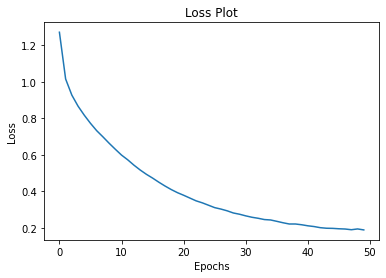

In [39]:
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

#### Caption

#### Με τη συνάρτηση αυτή γίνεται η πρόβλεψη για κάθε caption. H πρόβλεψη ξεκινά όταν η είσοδος είναι ο χαρακτήρας start ενώ ολοκληρώνεται με τον χαρακτήρα end. Tα attention weights αποθηκεύονται για το τελικό attention plot. 

In [40]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = inception_decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = inception_encoder(img_tensor_val)

    dec_input = tf.expand_dims([word_to_index( tf.convert_to_tensor('<start>'))], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = inception_decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        predicted_word = tf.compat.as_text(index_to_word(tf.convert_to_tensor(predicted_id)).numpy())
        result.append(predicted_word)

        if predicted_word == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

In [45]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))

    len_result = len(result)
    for i in range(len_result):
        temp_att = np.resize(attention_plot[i], (8, 8))
        grid_size = max(int(np.ceil(len_result/2)), 2)
        ax = fig.add_subplot(grid_size, grid_size, i+1)
        ax.set_title(result[i])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

In [46]:
#references: the actual captions
#hypothesis: the prediction

def get_image_blue(image_id):
    print('Real Captions - References:')
    references = []
    for j in range(5):
        refs = [tf.compat.as_text(index_to_word(tf.convert_to_tensor(i)).numpy()) for i in cap_val[image_id + j] if i not in [0]]
        print(' '.join(refs))
        references.append(refs[1:-1])
    print('Prediction Caption - Hypothesis:')
    image = img_name_val[image_id]
    result, attention_plot = evaluate(image)
    print(' '.join(result))
    score = nltk.translate.bleu_score.sentence_bleu(references, result[:-1], weights=(0.4, 0.3, 0.2, 0.1), smoothing_function=SmoothingFunction().method1)
    print('The sentence BLEU score is: ', score)
    plot_attention(image, result, attention_plot)
    print()

Real Captions - References:
<start> a boy in a red jacket and earmuffs is sitting in the snow in a city setting . <end>
<start> three people are playing in snow covered city streets . <end>
<start> three children play in the snow in an urban area . <end>
<start> a boy in a red jacket is sitting in the snow . <end>
<start> children are playing on a snowy street . <end>
Prediction Caption - Hypothesis:
a group of people in a blue jacket and black snow cap and black and orange parka , on a gray building in the snow next to a white building in the snow next to a large clear red cart through a pay his cart in a pay his cart
The sentence BLEU score is:  0.07904539209421538


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:15: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  from ipykernel import kernelapp as app


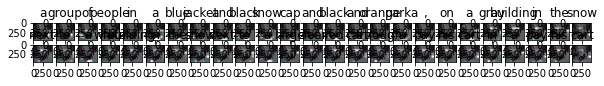


Real Captions - References:
<start> a man in a black suit and a woman wearing a white dress and holding flowers getting married <end>
<start> a man and a woman that is holding flowers smile in the sunlight . <end>
<start> a man and a woman get married in a wedding ceremony . <end>
<start> a happy couple enjoying their open air wedding . <end>
<start> a man and woman getting married . <end>
Prediction Caption - Hypothesis:
a woman holding a wedding dress . <end>
The sentence BLEU score is:  0.22743831206984158


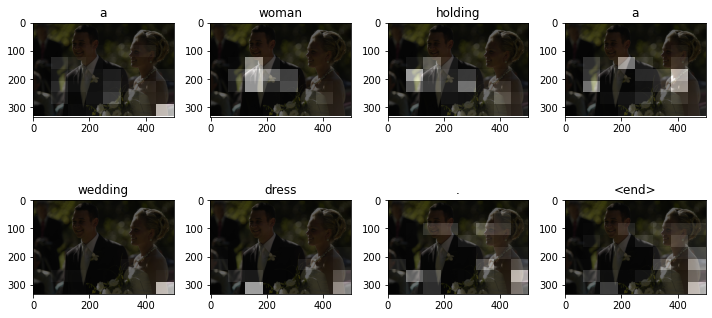


Real Captions - References:
<start> a man with no shirt on is washing his shirt in the fountain in the middle of a park . <end>
<start> a shirtless man is washing something in a street fountain . <end>
<start> a man in khaki pants holding his shirt in a fountain . <end>
<start> a man is holding his shirt into a fountain in a park . <end>
<start> a man washing his shirt , in a fountain in a park . <end>
Prediction Caption - Hypothesis:
a light blue shirt is leaning away from a pool . <end>
The sentence BLEU score is:  0.04806992306886678


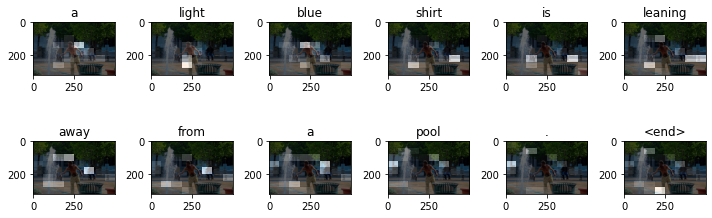


Real Captions - References:
<start> three rugby players in a field two are in a sprinting stance but all three have masks to protect their faces . <end>
<start> three males , in green t-shirts and shorts , practicing lacrosse , on a green grassy marked field . <end>
<start> three players participating in a team sport . <end>
<start> teenagers at a field playing a sport . <end>
<start> kids playing cricket with pads on <end>
Prediction Caption - Hypothesis:
two rugby player in black . <end>
The sentence BLEU score is:  0.08948461446831447


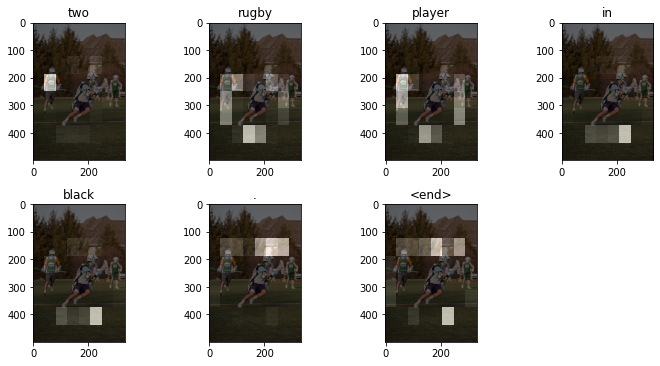


Real Captions - References:
<start> a group of people is walking in a meadow of flowers and taking pictures . <end>
<start> a crowd of people has gathered next to a field of colorful [UNK] . <end>
<start> many people are walking through a field in a line <end>
<start> a crowd of people walk on a park trail <end>
<start> many people wait [UNK] in line . <end>
Prediction Caption - Hypothesis:
a group of people walk through a rock . <end>
The sentence BLEU score is:  0.5846453692157478


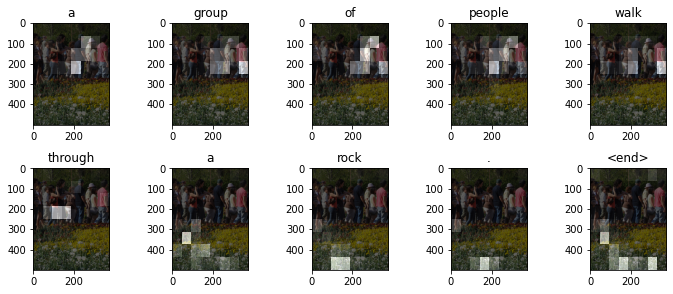


Real Captions - References:
<start> two women , one younger than the other sitting inside the back of an open truck eating a meal out of plastic containers . <end>
<start> two female workers take a break from their job to eat . <end>
<start> two woman are sitting in the back of a truck eating . <end>
<start> two women are sitting in the back of a truck <end>
<start> two ladies eating out of a truck . <end>
Prediction Caption - Hypothesis:
a man drives a building . <end>
The sentence BLEU score is:  0.048592757616447


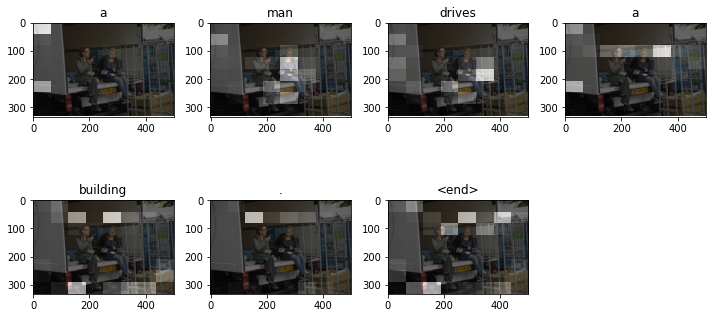

In [43]:
get_image_blue(0)

get_image_blue(20)

get_image_blue(600)

get_image_blue(225)

get_image_blue(565)

get_image_blue(365)

In [44]:
def get_vocab_blue(maximum_number_of_samples):
    total_refers = []
    total_res = []
    
    vocab = np.arange(0,maximum_number_of_samples,5)
    
    for image_id in vocab:
        references = []
        for j in range(5):
            refs = [tf.compat.as_text(index_to_word(tf.convert_to_tensor(i)).numpy()) for i in cap_val[image_id + j] if i not in [0]]
            references.append(refs[1:-1])
        total_refers.append(references)
        result, attention_plot = evaluate(img_name_val[image_id])
        total_res.append(result[:-1])
    score = nltk.translate.bleu_score.corpus_bleu(total_refers, total_res, weights=(0.4, 0.3, 0.2, 0.1), smoothing_function=SmoothingFunction().method1)
    print('Our corpus BLEU score for the first 100 images is:', score)
    

In [45]:
get_vocab_blue(100)

Our corpus BLEU score for the first 100 images is: 0.17223261022052577


Real Caption: <start> a dog chasing a deer in a field of yellow flowers . <end>
Prediction Caption: a dog gets two [UNK] through the back <end>


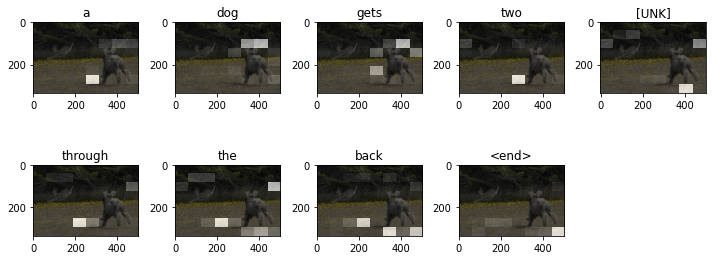

In [46]:
# captions on the validation set
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(tf.convert_to_tensor(i)).numpy()) for i in cap_val[rid] if i not in [0]])
result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)

###  ΒΕΛΤΙΩΣΕΙΣ

#### Προκειμένου να μειώσουμε το πλήθος των βαρών προς εκπαίδευση χρησιμοποιούμε έτοιμα embeddings με μεταφορά μάθησης, συγκεκριμένα τα *embeddings glove-wiki* διαστάσεων 100. Επειδή στο λεξιλόγιο των embeddings αυτών δεν υπάρχουν οι χαρακτήρες που σηματοδοτούν  την έναρξη και τη λήξη του caption, ως σύμβολο έναρξης θα θεωρήσουμε το "*" και ως λήξης την ".". Τα επόμενα βήματα είναι ίδια με αυτά του  tutorial.

In [7]:
image_path_to_caption = collections.defaultdict(list)
for i in range(len(train['caption'])):
    caption = '* ' + train['caption'][i]
    image_path = path+train['image'][i]
    image_path_to_caption[image_path].append(caption)

In [8]:
image_paths = list(image_path_to_caption.keys())
random.shuffle(image_paths)

# Select the first 6000 image_paths from the shuffled set.
# Approximately each image id has 5 captions associated with it, so that will
# lead to 30,000 examples.
train_image_paths = image_paths[:6000]
print(len(train_image_paths))

6000


In [9]:
train_captions = []
img_name_vector = []

for i in train_image_paths:
    caption_list = image_path_to_caption[i]
    train_captions.extend(caption_list)
    img_name_vector.extend([i] * len(caption_list))

* A man is leaping over a barrier away from a bull .


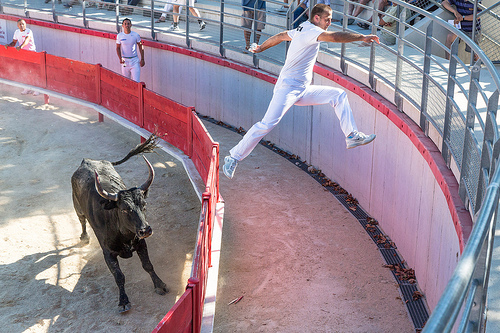

In [32]:
#show a picture
print(train_captions[63])
Image.open(img_name_vector[63])

#### Preprocess the images using resnet_v2

#### Στο βήμα αυτό χρησιμοποιούμε το μοντέλο που αντισοτιχεί στην ομάδα μας, το ResNet152V2. Το μοντέλο αυτό δέχεται τις εικόνες διαστάσεων 224x224. Η κανονικοποίηση των τιμών των pixels γίνεται ξανά με την *preprocess_input* στο εύρος [-1,1]. Τα features, οπως ακριβώς και πριν, εξάγονται από το τελευταίο επίπεδο. 

In [10]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.keras.layers.Resizing(224, 224)(img)
    img = tf.keras.applications.resnet_v2.preprocess_input(img)
    return img, image_path

#### Initialize resnet_v2 and load the pretrained Imagenet weights 

In [11]:
image_model = tf.keras.applications.ResNet152V2(include_top=False,
                                                weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

2022-03-03 17:49:37.212720: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-03 17:49:37.361020: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-03 17:49:37.361745: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-03 17:49:37.363255: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

234561536/234545216 [==============================] - 2s 0us/step


In [14]:
# Get unique images
encode_train = sorted(set(img_name_vector))

os.mkdir('/kaggle/working/resnet/')

# Feel free to change batch_size according to your system configuration
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.AUTOTUNE).batch(16)

for img, path in tqdm(image_dataset):
    batch_features = image_features_extract_model(img)
    batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

    for bf, p in zip(batch_features, path):
        path_of_feature = p.numpy().decode("utf-8")
        path_of_feature = path_of_feature.split('/')[-1]
        path_of_feature = '/kaggle/working/resnet/' + path_of_feature
        np.save(path_of_feature, bf.numpy())

  0%|          | 0/375 [00:00<?, ?it/s]2022-03-03 17:51:33.147594: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-03-03 17:51:34.057697: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005
100%|██████████| 375/375 [02:21<00:00,  2.64it/s]


#### Caching the features extracted from ResNet152V2

#### Preprocess and tokenize the captions

In [15]:
embeddings_100_model = gensim.downloader.load("glove-wiki-gigaword-100")
word2vec = embeddings_100_model

[==================================================] 100.0% 128.1/128.1MB downloaded


#### Αφού διαθέτουμε τα embeddings για κάθε λέξη του vocabulary του wiki-glove, δε χρησιμοποιούμε το TextVectorization. Συνεπώς, προβαίνουμε στη διαδικασία παράβλεψης ορισμένων χαρακτήρων (def standardize_resnet), padding μέχρι το μέγιστο μήκος και δημιουργία των vectors των tokenized captions. 

#### Στην παρακάτω συνάρτηση, παραλείπουμε πλέον τους χαρακτήρες '<', '>' και διατηρούμε τον χαρακτήρα '*' που σηματοδοτεί την έναρξη του caption. Η '.' που σηματοδοτεί το σύμβολο λήξης παραλείπεται αλλά φροντίζουμε να προστίθεται κατά το evaluate. To vocabulary εχει συνολικό μέγεθος 400000 λέξεις, όμως εμείς επιλέγουμε τις 200000.

In [16]:
#there is no need to preserve <> characters. we have to preserve the starting character '*'
def standardize_resnet(inputs):
    inputs = inputs.lower()
    inputs = re.sub(r"[!\"$<>%&\(\)\\+.,-/#:;=?@\[\\\]^_`{|}~]", "", inputs)
    return ' '.join(inputs.split())

vocabulary_size = 200000

In [17]:
standarized_captions = [standardize_resnet(cap) for cap in train_captions]

#### To παρακάτω ιστόγραμμα φανερώνει, πως οι περισσότερες εικόνες διαθέτουν περιγραφές μήκους από 5-19 λέξεις.

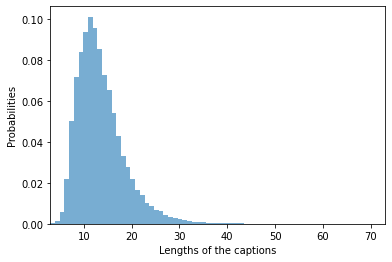

In [39]:
caption_lengths = [len(cap.split(" ")) for cap in standarized_captions]
bins = max(caption_lengths) - min(caption_lengths) + 1

plt.hist(caption_lengths, bins, density=True, alpha=0.6)
plt.xlabel('Lengths of the captions')
plt.ylabel('Probabilities')
plt.xlim(min(caption_lengths), max(caption_lengths))
#plt.grid(True)
plt.show()

#### Παρακάτω απορρίπτουμε περιγραφές με λέξεις περισσότερες ή λιγότερες του εύρους [5,19].

In [18]:
train_captions_final = []
img_name_vector_final = []
for cap, img in zip(standarized_captions, img_name_vector):
    length = len(cap.split(" "))
    if length > 19 or length < 5:
        continue
    else:
        train_captions_final.append(cap + " .") 
        img_name_vector_final.append(img)
img_name_vector = img_name_vector_final

#### Η συνάρτηση αυτή εφαρμόζει padding έως ότου η περιγραφή να φτάσει το μήκος των 19 λέξεων μαζί με το σύμβολο λήξης "."

In [19]:
def padding(cap):
    #_len = len(cap.split(" "))
    #pad_size = max_length - _len + 1
    #our padding character will be '@' instead of zero
    cap = cap + " @" * (19 - len(cap.split(" ")) + 1)
    return cap

train_captions_final = [padding(cap) for cap in train_captions_final]  
cap_vector = tf.data.Dataset.from_tensor_slices(train_captions_final)

#### Split the data into training and testing 

In [20]:
img_to_cap_vector = collections.defaultdict(list)
for img, cap in zip(img_name_vector, cap_vector):
    img_to_cap_vector[img].append(cap)

# Create training and validation sets using an 80-20 split randomly.
img_keys = list(img_to_cap_vector.keys())
random.shuffle(img_keys)

slice_index = int(len(img_keys)*0.8)
img_name_train_keys, img_name_val_keys = img_keys[:slice_index], img_keys[slice_index:]

img_name_train = []
cap_train = []
for imgt in img_name_train_keys:
    capt_len = len(img_to_cap_vector[imgt])
    img_name_train.extend([imgt] * capt_len)
    cap_train.extend(img_to_cap_vector[imgt])

img_name_val = []
cap_val = []
for imgv in img_name_val_keys:
    capv_len = len(img_to_cap_vector[imgv])
    img_name_val.extend([imgv] * capv_len)
    cap_val.extend(img_to_cap_vector[imgv])

In [44]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(19139, 19139, 4773, 4773)

#### Create a tf.data dataset for training

#### Aλλάζουμε το attention_features_shape σε 49.

In [21]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000
embedding_dim = 100
units = 512 
num_steps = len(img_name_train) // BATCH_SIZE
# Shape of the vector extracted from resnet is (49, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 49

In [22]:
# Load the numpy files

def map_func_resnet(img_name, cap):
    word_index = []
    cap_vec = []
    for word in str(cap).split(" "):
        if word not in word2vec.key_to_index:
            word_index.append(word2vec.key_to_index["@"])
            cap_vec.append(word2vec.get_vector("@"))
        else:
            word_index.append(word2vec.key_to_index[word])
            cap_vec.append(word2vec.get_vector(word))
            if word_index[-1] >= vocabulary_size:
                word_index[-1] = word2vec.key_to_index["@"]
            
    path_of_feature = img_name.decode('utf-8').split("/")[-1]
    img_tensor = np.load("/kaggle/working/resnet/"+path_of_feature+'.npy')
    
    return img_tensor, tf.convert_to_tensor(cap_vec, dtype=tf.float32), tf.convert_to_tensor(word_index, dtype=tf.int32)

In [23]:
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(map_func_resnet, [item1, item2], [tf.float32, tf.float32, tf.int32]), num_parallel_calls=tf.data.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

#### Model

In [24]:
class BahdanauAttention(tf.keras.Model):
    
    def __init__(self, units):
        super(BahdanauAttention, self).__init__()
        self.W1 = tf.keras.layers.Dense(units)
        self.W2 = tf.keras.layers.Dense(units)
        self.V = tf.keras.layers.Dense(1)

    def call(self, features, hidden):
        # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)

        # hidden shape == (batch_size, hidden_size)
        # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
        hidden_with_time_axis = tf.expand_dims(hidden, 1)

        # attention_hidden_layer shape == (batch_size, 64, units)
        attention_hidden_layer = (tf.nn.tanh(self.W1(features) +
                                             self.W2(hidden_with_time_axis)))

        # score shape == (batch_size, 64, 1)
        # This gives you an unnormalized score for each image feature.
        score = self.V(attention_hidden_layer)

        # attention_weights shape == (batch_size, 64, 1)
        attention_weights = tf.nn.softmax(score, axis=1)

        # context_vector shape after sum == (batch_size, hidden_size)
        context_vector = attention_weights * features
        context_vector = tf.reduce_sum(context_vector, axis=1)

        return context_vector, attention_weights

In [25]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

#### Στον RNN_Decoder υλοποιούμε και τα LSTM layers προκειμένου να τα συγκρίνουμε με τα GRUs.Eπιπλέον προσθέτουμε dropout layer μετά τα Dense. 

In [26]:
class RNN_Decoder(tf.keras.Model):
        def __init__(self, embedding_dim, units, vocab_size, GRU = True):
            super(RNN_Decoder, self).__init__()
            self.units = units
            self.GRU = GRU
            self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
            if self.GRU:
                self.gru = tf.keras.layers.GRU(self.units,
                                           return_sequences=True,
                                           return_state=True,
                                           recurrent_initializer='glorot_uniform')
            else:
                self.gru = tf.keras.layers.LSTM(self.units,
                                           return_sequences=True,
                                           return_state=True,
                                           recurrent_initializer='glorot_uniform')
            self.fc1 = tf.keras.layers.Dense(self.units)
            self.drp = tf.keras.layers.Dropout(0.4)
            self.fc2 = tf.keras.layers.Dense(vocab_size)

            self.attention = BahdanauAttention(self.units)

        def call(self, x, features, hidden):
            context_vector, attention_weights = self.attention(features, hidden)
            
            #print("the shape of attention_weights  is: ", tf.shape(attention_weights))
            
            # x shape after passing through embedding == (batch_size, 1, embedding_dim)
            #x = self.embedding(x)
            #print("the shape of x without embedding is: ", tf.shape(x))
            #print("the shape of context_vector is: ", tf.shape(tf.expand_dims(context_vector, 1,100)))
            
            x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)
            #print("the shape of x after concat  is: ", tf.shape(x))
            #x = tf.concat([context_vector, x], axis=-1)

            if self.GRU:
                output, state = self.gru(x)
            else:
                output, state, carry_state = self.gru(x)

            x = self.fc1(output)
            x = self.drp(x, training=True)
            
            x = tf.reshape(x, (-1, x.shape[2]))

            x = self.fc2(x)

            return x, state, attention_weights

        def reset_state(self, batch_size):
            return tf.zeros((batch_size, self.units))

In [51]:
encoder = CNN_Encoder(embedding_dim)
# decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size())
decoder = RNN_Decoder(embedding_dim, units, vocabulary_size)

In [28]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, word2vec.key_to_index["@"]))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask

    return tf.reduce_mean(loss_)

#### Checkpoint

In [30]:
checkpoint_path = "./checkpoints/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer=optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [53]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
    # restoring the latest checkpoint in checkpoint_path
    ckpt.restore(ckpt_manager.latest_checkpoint)

#### Training

In [54]:
loss_plot = []

def train_step(img_tensor, target, target_indexes):
    loss = 0

    # initializing the hidden state for each batch
    # because the captions are not related from image to image
    hidden = decoder.reset_state(batch_size=target.shape[0])

    dec_input = tf.expand_dims([tf.convert_to_tensor(word2vec.get_vector("*"))] * target.shape[0],1)

    with tf.GradientTape() as tape:
        features = encoder(img_tensor)

        for i in range(1, target.shape[1]):
            # passing the features through the decoder
            predictions, hidden, _ = decoder(dec_input, features, hidden)

            loss += loss_function(target_indexes[:, i], predictions)

            # using teacher forcing
            dec_input = tf.expand_dims(target[:, i], 1)

    total_loss = (loss / int(target.shape[1]))

    trainable_variables = encoder.trainable_variables + decoder.trainable_variables

    gradients = tape.gradient(loss, trainable_variables)

    optimizer.apply_gradients(zip(gradients, trainable_variables))

    return loss, total_loss

In [42]:
def train_model():
    EPOCHS = 30

    for epoch in range(start_epoch, EPOCHS):
        start = time.time()
        total_loss = 0


        for (batch, (img_tensor, target, indexes)) in enumerate(dataset):
            batch_loss, t_loss = train_step(img_tensor, target, indexes)
            total_loss += t_loss

            if batch % 100 == 0:
                average_batch_loss = batch_loss.numpy() / int(target.shape[1])
                print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
        # storing the epoch end loss value to plot later
        loss_plot.append(total_loss / num_steps)

        if epoch % 5 == 0:
            ckpt_manager.save()

        print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
        print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

In [36]:
train_model()

Epoch 1 Batch 0 Loss 3.4386
Epoch 1 Batch 100 Loss 3.3309
Epoch 1 Batch 200 Loss 2.7912
Epoch 1 Loss 3.075125
Time taken for 1 epoch 175.61 sec

Epoch 2 Batch 0 Loss 2.7660
Epoch 2 Batch 100 Loss 2.8038
Epoch 2 Batch 200 Loss 2.6520
Epoch 2 Loss 2.593695
Time taken for 1 epoch 172.47 sec

Epoch 3 Batch 0 Loss 2.4946
Epoch 3 Batch 100 Loss 2.7516
Epoch 3 Batch 200 Loss 2.2795
Epoch 3 Loss 2.442008
Time taken for 1 epoch 173.71 sec

Epoch 4 Batch 0 Loss 2.2581
Epoch 4 Batch 100 Loss 2.4236
Epoch 4 Batch 200 Loss 2.0830
Epoch 4 Loss 2.333284
Time taken for 1 epoch 173.31 sec

Epoch 5 Batch 0 Loss 2.3290
Epoch 5 Batch 100 Loss 2.3403
Epoch 5 Batch 200 Loss 2.2367
Epoch 5 Loss 2.246968
Time taken for 1 epoch 173.05 sec

Epoch 6 Batch 0 Loss 2.1316
Epoch 6 Batch 100 Loss 2.2897
Epoch 6 Batch 200 Loss 2.2593
Epoch 6 Loss 2.168835
Time taken for 1 epoch 176.69 sec

Epoch 7 Batch 0 Loss 2.2185
Epoch 7 Batch 100 Loss 2.1782
Epoch 7 Batch 200 Loss 2.0850
Epoch 7 Loss 2.095496
Time taken for 1 epo

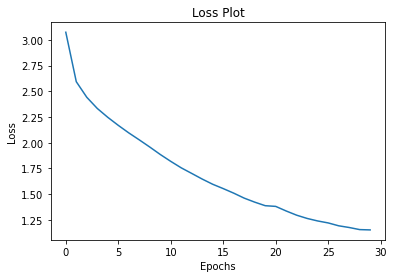

In [58]:
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

#### Caption

#### H η συνάρτηση evaluate  πλέον δέχεται ως παράμετρο τον τρόπο με τον οποίον θα επιλέγεται η επόμενη λέξη πρόβλεψης του  caption. Συνεπώς, με είσοδο το string 'categorical' η επιλογή της επόμενης λέξης γίενται μέσω της  tf.random.categorical. Με είσοδο το string greedy η επόμενη λέξη που επιλέγεται είναι η πιο πιθανή.

In [38]:
def evaluate(image, way = 'categorical'):
    attention_plot = np.zeros((19, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, 
                                (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tf.convert_to_tensor(word2vec.get_vector("*"))],0)
    result = []
    #max_length = 19
    for i in range(19):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        #print("attention plot shape is: ", tf.shape(attention_plot[i]))
        #print("attention weights shape is: ", tf.shape(attention_weights))
        
        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
        
        if way == 'categorical':
            predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        elif way == 'greedy':
            predicted_id = tf.math.argmax(predictions, axis=1)[0].numpy()

        predicted_word = tf.compat.as_text(word2vec.index_to_key[predicted_id])
        result.append(predicted_word)

        if predicted_word == '.':
            return result, attention_plot

        dec_input = tf.expand_dims([word2vec.get_vector(predicted_word)], 0)

    attention_plot = attention_plot[:len(result), :]
    
    if result[-1] != ".":
        result.append(".")
    
    return result, attention_plot

#### Tέλος υλοποιούμε τη μέθοδο beam search, με υπερπαράμετρο k που είναι το πλάτος της ακτίνας. Για να διαλέξει την επόμενη λέξη ξεκινάει από την αρχή της πρότασης και κρατάει τις k τo πλήθος καλύτερες λέξεις για το επόμενο βήμα. Με τον τρόπο αυτό δημιουργούντα k κλαδιά. Για το επόμενο βήμα υπολογίζει τις πιθανότητες των επόμενων λέξεων για όλα τα κλαδιά και κρατάει τις k πιθανότερες κοκ. Στο τέλος καταλήγουμε να έχουμε b πιθανές προτάσεις και διαλέγουμε αυτή με τις καλύτερες πιθανότητες συνολικά. H υλοποίησή μας  βασίστηκε στην παρακάτω:  https://machinelearningmastery.com/beam-search-decoder-natural-language-processing/

In [39]:
def beam_search(image, k=2):
    
    # compute hidden, temp_imput,img_tensor_val,features, dec_input, attention_plot, result
    #just like def evaluate
    hidden = decoder.reset_state(batch_size=1)
    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0],
                                                 -1,
                                                 img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)
    
    #our starting now symbol is "*" 
    dec_input = tf.expand_dims([tf.convert_to_tensor(word2vec.get_vector("*"))],0)
    result = []
    attention_plot = np.zeros((19, attention_features_shape))
    
    candidates = [(dec_input, hidden, result, attention_plot, [])]
    all_candidates = []
    #max_length = 19
    for i in range(19):
        cans = []
        
        for dec_input, hidden, result, attention_plot, probs in candidates:
            predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

            probabilities = np.array([value for value in tf.math.top_k(predictions, k).values[0].numpy()])
            inds = np.array([ind for ind in tf.math.top_k(predictions, k).indices[0].numpy()])
            next_words = np.array([tf.compat.as_text(word2vec.index_to_key[id_]) for id_ in inds])
            
            l1 = []
            l2 = []
            for probability, next_word in zip( probabilities, next_words):
                
                l1.append(next_word)
                l2.append(probability)
                cans.append((dec_input, hidden, l1, attention_plot, l2))
                attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
                dec_input = tf.expand_dims([word2vec.get_vector(next_word)], 0)
                

        #compute the k most probable
        sorted_candidates = sorted(cans, key=lambda x: np.prod(x[4]), reverse=True)
        candidates = sorted_candidates[:k]
        
        
        # Break when you find all k candidates
        if len(all_candidates) == k:
            break
         
        #if the caption is valid and finished (final character is .)
        #add it to the candidates
        for can in candidates:
            if can[2][-1] == '.':
                all_candidates.append((can[2], can[3], can[4]))
            # Stop if k all_candidates found
            if len(all_candidates) == k:
                break
            
    #comput the log sum divided by the number of candidates
    logsum = []
    for result, attention_plot, probabilities in all_candidates:
        S = 0
        for prob in probabilities:
            S += + np.log(prob)
        output = S / len(result)
        logsum.append((result, attention_plot, output))
        
    best = np.sort(logsum[2])[::-1]
    result = best[0]
    
    final_plot = best[1][:len(best[0]), :]
    
    return result, final_plot

#### Αξιολόγηση της ποιότητας του captioning

In [40]:
import math
import sys
import warnings
from collections import Counter
from fractions import Fraction
from nltk.util import ngrams

In [49]:
#references: the actual captions
#hypothesis: the prediction

def get_image_blue(image_id, way="categorical"):
    
    print('Real Captions - References:')
    img_2_cap_vector = collections.defaultdict(list)
    for img, cap in zip(img_name_val, cap_val):
        img_2_cap_vector[img].append(cap)
        
    img = list(img_2_cap_vector.items())[image_id]
    references = []
    for ref in img[1]:
        ref = tf.compat.as_text(ref.numpy())
        ref = ref.split(".")[0]
        ref = ref.split(" ")[1:-1]
        print(ref)
        references.append(ref)
        
    print('Prediction - Hypothesis:')
    
    if way == "categorical":
        result, attention_plot = evaluate(img[0])
    
    elif way == "greedy":
        result, attention_plot = evaluate(img[0], "greedy")
    
    else:
        result, attention_plot = beam_search(img[0])
    
    print(result[:-1])
    score = nltk.translate.bleu_score.sentence_bleu(references, result[:-1], weights=(0.4, 0.3, 0.2, 0.1), smoothing_function=SmoothingFunction().method1)
    print('Sentence BLEU Score =', score)
    print()
    plot_attention(img[0], result[:-1], attention_plot)
    print()

#### GRU results:

Real Captions - References:
['a', 'man', 'in', 'a', 'gray', 'shirt', 'sitting', 'in', 'a', 'field', 'of', 'flowers']
['the', 'man', 'is', 'in', 'a', 'field', 'of', 'tulips']
['a', 'group', 'of', 'children', 'dressed', 'for', 'halloween', 'stand', 'in', 'line', 'with', 'the', 'exception', 'of', 'one', 'girl']
['a', 'blond', 'girl', 'in', 'a', 'black', 'cape', 'stands', 'with', 'other', 'children', 'in', 'costumes']
Prediction - Hypothesis:
['a', 'teenage', 'man', 'wearing', 'pink', 'shirt', 'is', 'passing', 'a', 'sunny', 'air', 'off', 'the', 'sunny', 'day']
Sentence BLEU Score = 0.0344608372956094



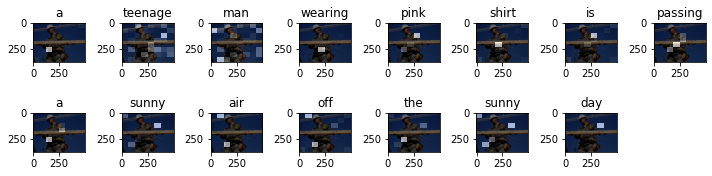


Real Captions - References:
['a', 'man', 'in', 'a', 'gray', 'shirt', 'sitting', 'in', 'a', 'field', 'of', 'flowers']
['the', 'man', 'is', 'in', 'a', 'field', 'of', 'tulips']
['a', 'group', 'of', 'children', 'dressed', 'for', 'halloween', 'stand', 'in', 'line', 'with', 'the', 'exception', 'of', 'one', 'girl']
['a', 'blond', 'girl', 'in', 'a', 'black', 'cape', 'stands', 'with', 'other', 'children', 'in', 'costumes']
Prediction - Hypothesis:
['a', 'man', 'is', 'standing', 'by', 'a', 'table', 'bicyclist']
Sentence BLEU Score = 0.15518164022348369



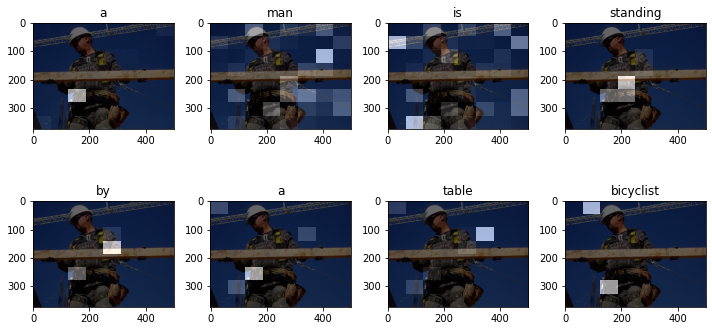


Real Captions - References:
['a', 'man', 'in', 'a', 'gray', 'shirt', 'sitting', 'in', 'a', 'field', 'of', 'flowers']
['the', 'man', 'is', 'in', 'a', 'field', 'of', 'tulips']
['a', 'group', 'of', 'children', 'dressed', 'for', 'halloween', 'stand', 'in', 'line', 'with', 'the', 'exception', 'of', 'one', 'girl']
['a', 'blond', 'girl', 'in', 'a', 'black', 'cape', 'stands', 'with', 'other', 'children', 'in', 'costumes']
Prediction - Hypothesis:
['a', 'man', 'in', 'black']
Sentence BLEU Score = 0.22525380780456272



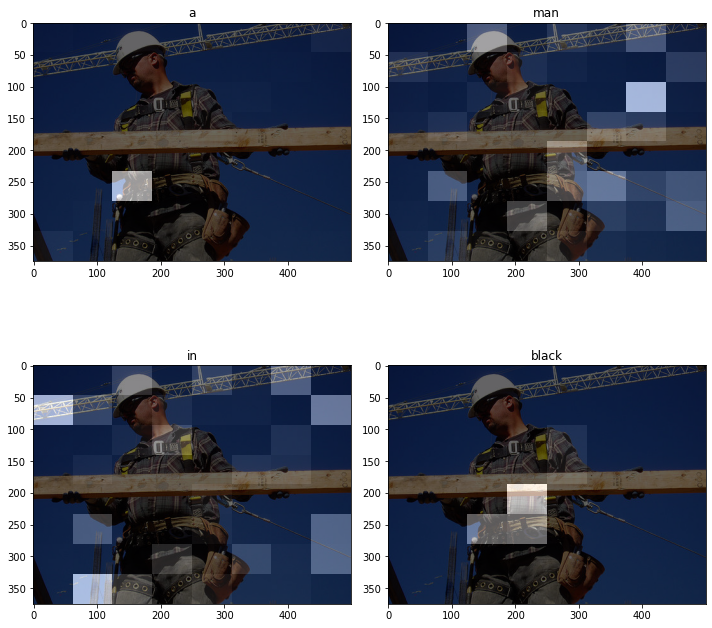


Real Captions - References:
['three', 'men', 'wearing', 'uniforms', 'are', 'standing', 'on', 'a', 'sidewalk']
['three', 'men', 'wearing', 'red', 'prevention', 'vests', 'stand', 'ready']
['men', 'in', 'red', 'vests', 'watching', 'street', 'corner']
['a', 'flight', 'attendant', 'showing', 'passengers', 'how', 'to', 'use', 'the', 'airplane', 'safety', 'vest']
Prediction - Hypothesis:
['a', 'group', 'of', 'fans', 'in', 'a', 'blue', 'sweater', 'is', 'sitting', 'on']
Sentence BLEU Score = 0.03578101126480633



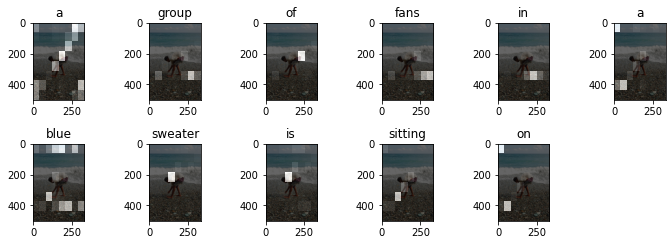


Real Captions - References:
['three', 'men', 'wearing', 'uniforms', 'are', 'standing', 'on', 'a', 'sidewalk']
['three', 'men', 'wearing', 'red', 'prevention', 'vests', 'stand', 'ready']
['men', 'in', 'red', 'vests', 'watching', 'street', 'corner']
['a', 'flight', 'attendant', 'showing', 'passengers', 'how', 'to', 'use', 'the', 'airplane', 'safety', 'vest']
Prediction - Hypothesis:
['a', 'group', 'of', 'people', 'with', 'their', 'fellow', 'teammate', 'in', 'a', 'blue', 'shirt', 'is', 'sitting', 'on', 'his', 'lap', 'of', 'sprinklers']
Sentence BLEU Score = 0.02169019854560574



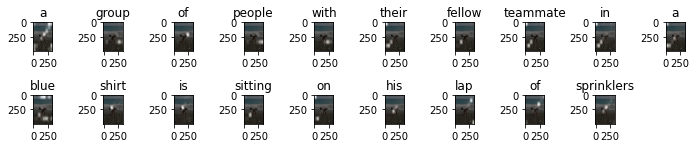


Real Captions - References:
['three', 'men', 'wearing', 'uniforms', 'are', 'standing', 'on', 'a', 'sidewalk']
['three', 'men', 'wearing', 'red', 'prevention', 'vests', 'stand', 'ready']
['men', 'in', 'red', 'vests', 'watching', 'street', 'corner']
['a', 'flight', 'attendant', 'showing', 'passengers', 'how', 'to', 'use', 'the', 'airplane', 'safety', 'vest']
Prediction - Hypothesis:
['two', 'women', 'in', 'a', 'blue', 'shirt', 'is', 'drinking']
Sentence BLEU Score = 0.047876163445161476



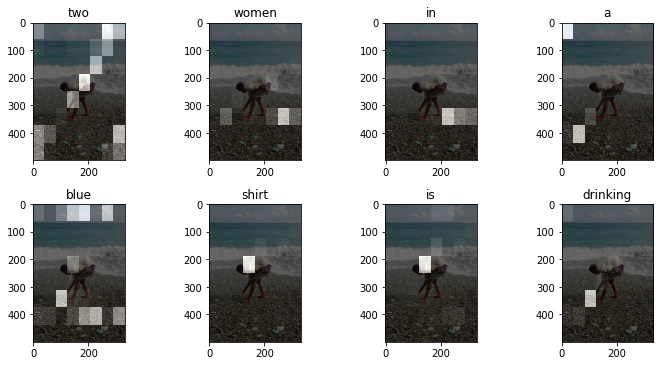


Real Captions - References:
['three', 'young', 'blond', 'girls', 'wearing', 'brightly', 'colored', 'clothes', 'are', 'having', 'fun', 'outdoors', 'under', 'a', 'rainbow', 'colored', 'umbrella']
['three', 'children', 'play', 'on', 'the', 'grass', 'under', 'a', 'multicolored', 'umbrella', 'and', 'wearing', 'rainbow', 'colored', 'outfits']
['kids', 'in', 'colorful', 'clothing', 'relax', 'on', 'the', 'grass', 'under', 'a', 'multicolored', 'umbrella']
['three', 'girls', 'playing', 'and', 'smiling', 'on', 'the', 'grass', 'under', 'an', 'umbrella']
['children', 'sitting', 'on', 'the', 'grass', 'and', 'covered', 'with', 'a', 'umbrella']
Prediction - Hypothesis:
['a', 'family', 'watching', 'a', 'horse', 'in', 'snow']
Sentence BLEU Score = 0.03654274779800285



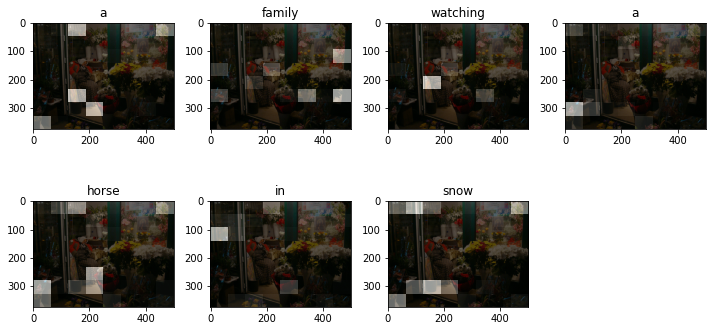


Real Captions - References:
['three', 'young', 'blond', 'girls', 'wearing', 'brightly', 'colored', 'clothes', 'are', 'having', 'fun', 'outdoors', 'under', 'a', 'rainbow', 'colored', 'umbrella']
['three', 'children', 'play', 'on', 'the', 'grass', 'under', 'a', 'multicolored', 'umbrella', 'and', 'wearing', 'rainbow', 'colored', 'outfits']
['kids', 'in', 'colorful', 'clothing', 'relax', 'on', 'the', 'grass', 'under', 'a', 'multicolored', 'umbrella']
['three', 'girls', 'playing', 'and', 'smiling', 'on', 'the', 'grass', 'under', 'an', 'umbrella']
['children', 'sitting', 'on', 'the', 'grass', 'and', 'covered', 'with', 'a', 'umbrella']
Prediction - Hypothesis:
['a', 'woman', 'is', 'empty', 'with', 'water']
Sentence BLEU Score = 0.03481823229930724



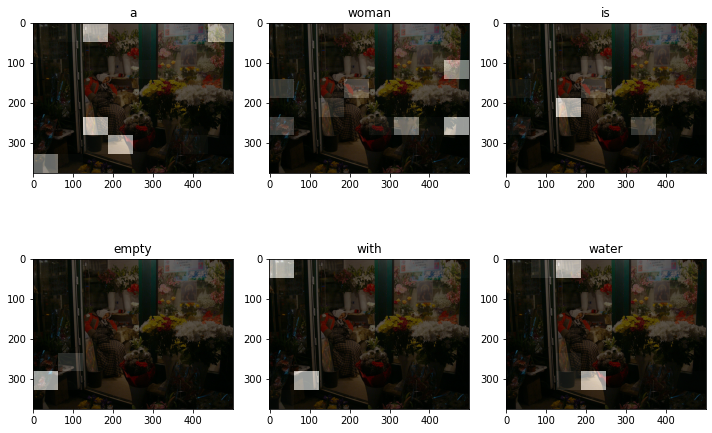


Real Captions - References:
['three', 'young', 'blond', 'girls', 'wearing', 'brightly', 'colored', 'clothes', 'are', 'having', 'fun', 'outdoors', 'under', 'a', 'rainbow', 'colored', 'umbrella']
['three', 'children', 'play', 'on', 'the', 'grass', 'under', 'a', 'multicolored', 'umbrella', 'and', 'wearing', 'rainbow', 'colored', 'outfits']
['kids', 'in', 'colorful', 'clothing', 'relax', 'on', 'the', 'grass', 'under', 'a', 'multicolored', 'umbrella']
['three', 'girls', 'playing', 'and', 'smiling', 'on', 'the', 'grass', 'under', 'an', 'umbrella']
['children', 'sitting', 'on', 'the', 'grass', 'and', 'covered', 'with', 'a', 'umbrella']
Prediction - Hypothesis:
['a', 'woman', 'walks', 'up', 'a', 'rocky', 'shore', 'of', 'water']
Sentence BLEU Score = 0.02833259310860531



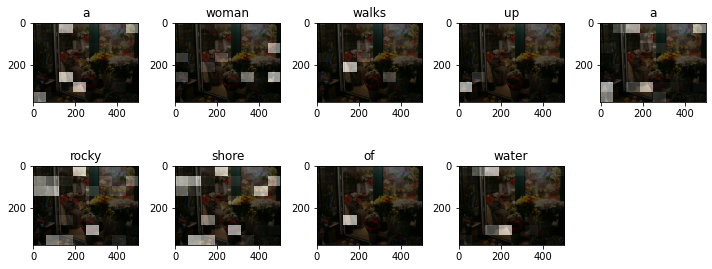


Real Captions - References:
['a', 'young', 'girl', 'contorts', 'her', 'body', 'during', 'a', 'performance']
['woman', 'performing', 'some', 'type', 'of', 'dance', 'move']
['a', 'young', 'girl', 'with', 'blondhair', 'and', 'a', 'green', 'shirt', 'plays', 'jump', 'rope']
['a', 'young', 'blond', 'girl', 'in', 'a', 'green', 'shirt', 'holding', 'something']
['a', 'young', 'girl', 'with', 'a', 'green', 'tshirt', 'and', 'blondhair']
Prediction - Hypothesis:
['a', 'black', 'sits', 'alone', 'on', 'the', 'rail', 'track']
Sentence BLEU Score = 0.036283347037395386



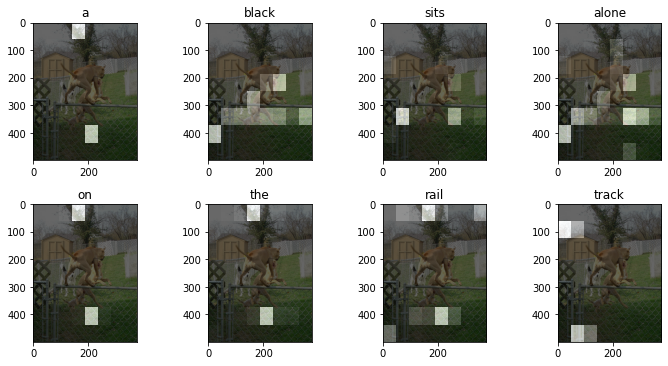


Real Captions - References:
['a', 'young', 'girl', 'contorts', 'her', 'body', 'during', 'a', 'performance']
['woman', 'performing', 'some', 'type', 'of', 'dance', 'move']
['a', 'young', 'girl', 'with', 'blondhair', 'and', 'a', 'green', 'shirt', 'plays', 'jump', 'rope']
['a', 'young', 'blond', 'girl', 'in', 'a', 'green', 'shirt', 'holding', 'something']
['a', 'young', 'girl', 'with', 'a', 'green', 'tshirt', 'and', 'blondhair']
Prediction - Hypothesis:
['a', 'brown', 'dog', 'is', 'riding', 'a', 'bike', 'along', 'the', 'sidewalk', 'of', 'a', 'black', 'suit', 'made', 'a', 'red', 'made', 'of']
Sentence BLEU Score = 0.02169019854560574



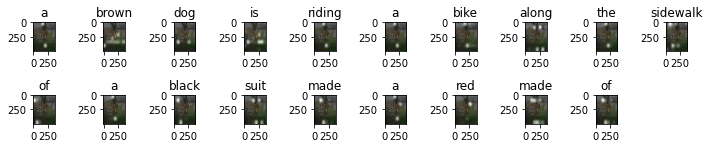


Real Captions - References:
['a', 'young', 'girl', 'contorts', 'her', 'body', 'during', 'a', 'performance']
['woman', 'performing', 'some', 'type', 'of', 'dance', 'move']
['a', 'young', 'girl', 'with', 'blondhair', 'and', 'a', 'green', 'shirt', 'plays', 'jump', 'rope']
['a', 'young', 'blond', 'girl', 'in', 'a', 'green', 'shirt', 'holding', 'something']
['a', 'young', 'girl', 'with', 'a', 'green', 'tshirt', 'and', 'blondhair']
Prediction - Hypothesis:
['a', 'brown', 'dog', 'is', 'running', 'on', 'the', 'sidewalk']
Sentence BLEU Score = 0.036283347037395386



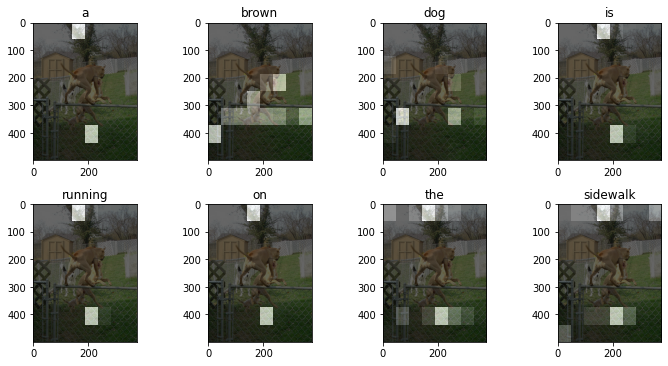


Real Captions - References:
['a', 'blondhaired', 'girl', 'is', 'wearing', 'a', 'purple', 'top', 'yellow', 'pants', 'different', 'colored', 'socks', 'and', 'shoes']
['a', 'little', 'girl', 'with', 'a', 'purple', 'shirt', 'looks', 'over', 'the', 'rail']
['a', 'child', 'in', 'a', 'purple', 'shirt', 'stares', 'over', 'a', 'metal', 'railing']
['little', 'girl', 'leaning', 'on', 'guard', 'rail']
Prediction - Hypothesis:
['kids', 'sitting', 'on', 'sidewalk', 'man', 'baseball']
Sentence BLEU Score = 0.05139541471864835



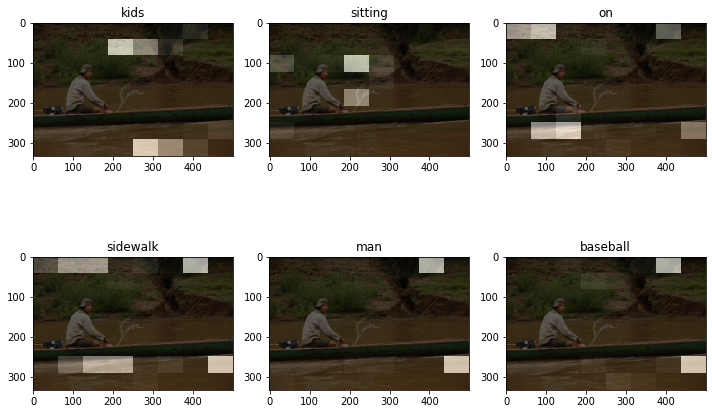


Real Captions - References:
['a', 'blondhaired', 'girl', 'is', 'wearing', 'a', 'purple', 'top', 'yellow', 'pants', 'different', 'colored', 'socks', 'and', 'shoes']
['a', 'little', 'girl', 'with', 'a', 'purple', 'shirt', 'looks', 'over', 'the', 'rail']
['a', 'child', 'in', 'a', 'purple', 'shirt', 'stares', 'over', 'a', 'metal', 'railing']
['little', 'girl', 'leaning', 'on', 'guard', 'rail']
Prediction - Hypothesis:
['a', 'woman', 'is', 'standing', 'in', 'the', 'background']
Sentence BLEU Score = 0.07401835097758909



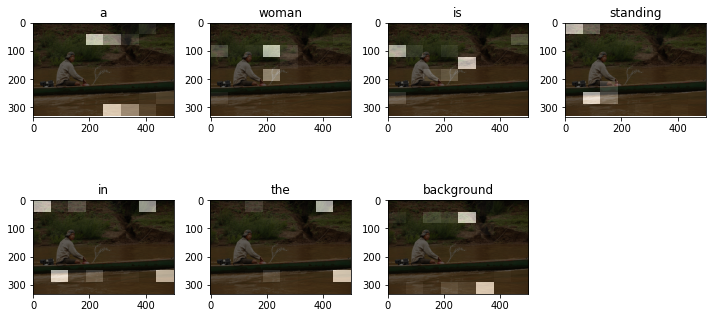


Real Captions - References:
['a', 'blondhaired', 'girl', 'is', 'wearing', 'a', 'purple', 'top', 'yellow', 'pants', 'different', 'colored', 'socks', 'and', 'shoes']
['a', 'little', 'girl', 'with', 'a', 'purple', 'shirt', 'looks', 'over', 'the', 'rail']
['a', 'child', 'in', 'a', 'purple', 'shirt', 'stares', 'over', 'a', 'metal', 'railing']
['little', 'girl', 'leaning', 'on', 'guard', 'rail']
Prediction - Hypothesis:
['two', 'people', 'are', 'working', 'on', 'the', 'street']
Sentence BLEU Score = 0.05609542040125645



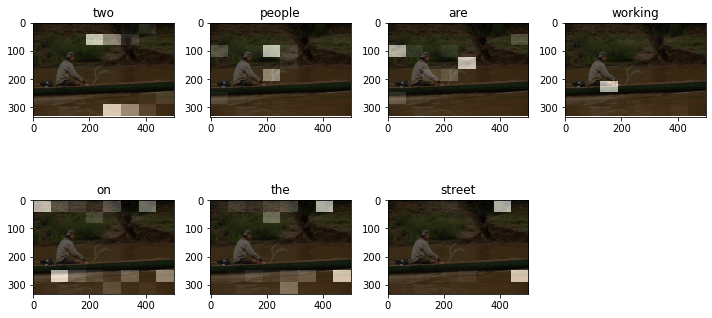


Real Captions - References:
['a', 'group', 'of', 'people', 'working', 'on', 'computers', 'in', 'a', 'large', 'rectangle', 'room']
['two', 'females', 'one', 'in', 'a', 'dark', 'blue', 'shirt', 'and', 'the', 'other', 'in', 'a', 'white', 'shirt', 'are', 'playing', 'lacrosse']
['a', 'female', 'lacrosse', 'player', 'in', 'blue', 'chasing', 'another', 'in', 'white', 'who', 'is', 'moving', 'away', 'with', 'the', 'ball']
['two', 'girls', 'compete', 'over', 'the', 'ball', 'while', 'playing', 'lacrosse']
Prediction - Hypothesis:
['a', 'blond', 'girl', 'does', 'his', 'roller', 'in', 'to', 'go', 'a', 'tennis', 'match', 'in', 'the', 'ground']
Sentence BLEU Score = 0.029970939805030225



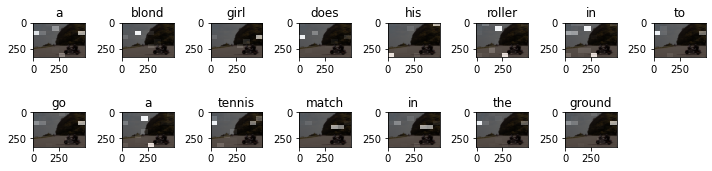


Real Captions - References:
['a', 'group', 'of', 'people', 'working', 'on', 'computers', 'in', 'a', 'large', 'rectangle', 'room']
['two', 'females', 'one', 'in', 'a', 'dark', 'blue', 'shirt', 'and', 'the', 'other', 'in', 'a', 'white', 'shirt', 'are', 'playing', 'lacrosse']
['a', 'female', 'lacrosse', 'player', 'in', 'blue', 'chasing', 'another', 'in', 'white', 'who', 'is', 'moving', 'away', 'with', 'the', 'ball']
['two', 'girls', 'compete', 'over', 'the', 'ball', 'while', 'playing', 'lacrosse']
Prediction - Hypothesis:
['a', 'woman', 'is', 'running', 'through', 'the', 'back']
Sentence BLEU Score = 0.049576946330072647



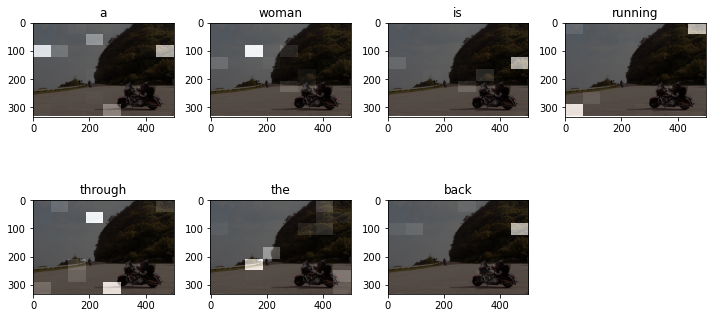


Real Captions - References:
['a', 'group', 'of', 'people', 'working', 'on', 'computers', 'in', 'a', 'large', 'rectangle', 'room']
['two', 'females', 'one', 'in', 'a', 'dark', 'blue', 'shirt', 'and', 'the', 'other', 'in', 'a', 'white', 'shirt', 'are', 'playing', 'lacrosse']
['a', 'female', 'lacrosse', 'player', 'in', 'blue', 'chasing', 'another', 'in', 'white', 'who', 'is', 'moving', 'away', 'with', 'the', 'ball']
['two', 'girls', 'compete', 'over', 'the', 'ball', 'while', 'playing', 'lacrosse']
Prediction - Hypothesis:
['two', 'men', 'are', 'swinging', 'a', 'soccer', 'game']
Sentence BLEU Score = 0.049576946330072647



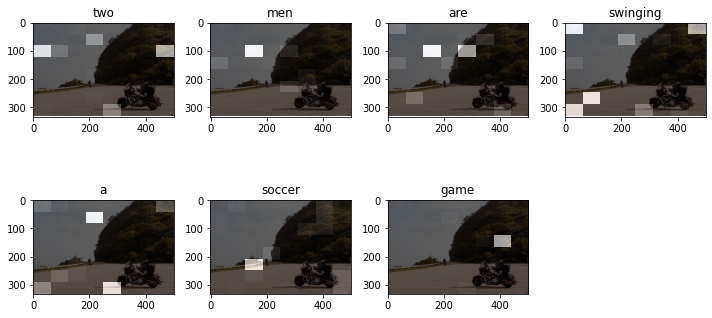


Real Captions - References:
['two', 'men', 'take', 'part', 'in', 'a', 'karate', 'demonstration', 'while', 'a', 'crowd', 'looks', 'on']
['two', 'men', 'are', 'instructing', 'others', 'in', 'martial', 'arts']
['man', 'and', 'a', 'woman', 'sitting', 'in', 'black', 'chairs', 'drinking']
['a', 'man', 'and', 'women', 'sip', 'drinks', 'in', 'two', 'leather', 'chairs']
Prediction - Hypothesis:
['bridesmaids', 'wearing', 'a', 'pink', 'shirt', 'and', 'a', 'black', 'shirt', 'walks', 'a', 'speed', 'during', 'a', 'parade', 'in', 'the', 'water']
Sentence BLEU Score = 0.05622263563545791



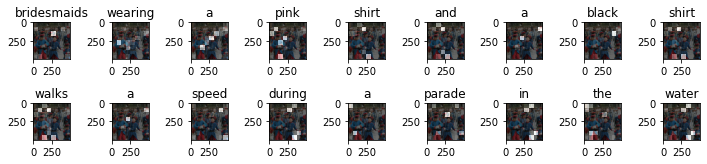


Real Captions - References:
['two', 'men', 'take', 'part', 'in', 'a', 'karate', 'demonstration', 'while', 'a', 'crowd', 'looks', 'on']
['two', 'men', 'are', 'instructing', 'others', 'in', 'martial', 'arts']
['man', 'and', 'a', 'woman', 'sitting', 'in', 'black', 'chairs', 'drinking']
['a', 'man', 'and', 'women', 'sip', 'drinks', 'in', 'two', 'leather', 'chairs']
Prediction - Hypothesis:
['a', 'boy', 'wearing', 'glasses', 'follows', 'to', 'be', 'cutting', 'wood']
Sentence BLEU Score = 0.03166221306577075



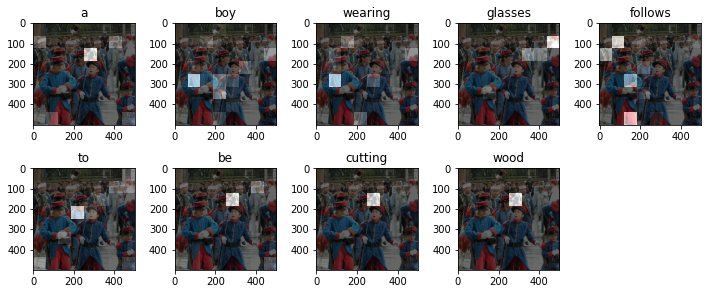


Real Captions - References:
['two', 'men', 'take', 'part', 'in', 'a', 'karate', 'demonstration', 'while', 'a', 'crowd', 'looks', 'on']
['two', 'men', 'are', 'instructing', 'others', 'in', 'martial', 'arts']
['man', 'and', 'a', 'woman', 'sitting', 'in', 'black', 'chairs', 'drinking']
['a', 'man', 'and', 'women', 'sip', 'drinks', 'in', 'two', 'leather', 'chairs']
Prediction - Hypothesis:
['a', 'young', 'man', 'is', 'sweeping', 'a', 'vast', 'room']
Sentence BLEU Score = 0.05630615150681703



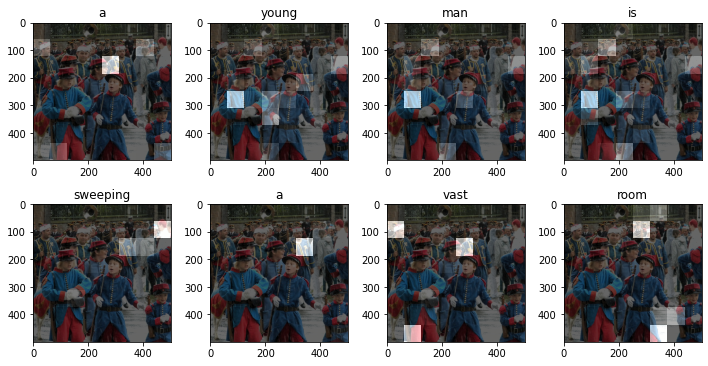

In [64]:
get_image_blue(0, "categorical")
get_image_blue(0, "greedy")
get_image_blue(0, "beam search")
get_image_blue(5, "categorical")
get_image_blue(5, "greedy")
get_image_blue(5, "beam search")
get_image_blue(10, "categorical")
get_image_blue(10, "greedy")
get_image_blue(10, "beam search")
get_image_blue(20, "categorical")
get_image_blue(20, "greedy")
get_image_blue(20, "beam search")
get_image_blue(105, "categorical")
get_image_blue(105, "greedy")
get_image_blue(105, "beam search")
get_image_blue(150, "categorical")
get_image_blue(150, "greedy")
get_image_blue(150, "beam search")
get_image_blue(190, "categorical")
get_image_blue(190, "greedy")
get_image_blue(190, "beam search")

In [50]:
def get_vocab_blue(maximum_number_of_captions, way="categorical"):
    
    img_2_cap_vector = collections.defaultdict(list)
    for img, cap in zip(img_name_val, cap_val):
        img_2_cap_vector[img].append(cap)

    total_refs = []
    total_res = []

    for img in list(img_2_cap_vector.items())[:maximum_number_of_captions]:
        references = []
        for ref in img[1]:
            ref = tf.compat.as_text(ref.numpy())
            ref = ref.split(".")[0]
            ref = ref.split(" ")[1:-1]
            references.append(ref)
        
        if way == "categorical":
            result, _ = evaluate(img[0])
        elif way == "greedy":
            result, _ = evaluate(img[0], "greedy")
        else:
            result, _ = beam_search(img[0])
        result = result[:-1]

        total_refs.append(references)
        total_res.append(result)
    
    score = nltk.translate.bleu_score.corpus_bleu(total_refs, total_res, weights=(0.4, 0.3, 0.2, 0.1), smoothing_function=SmoothingFunction().method1) 
    print('Corpus BLEU Score '+way+": ", score)
    

In [66]:
get_vocab_blue(100, "categorical")

get_vocab_blue(100, "greedy")

get_vocab_blue(100, "beam search")

Corpus BLEU Score categorical:  0.23207403057675847
Corpus BLEU Score greedy:  0.27922365141008503
Corpus BLEU Score beam search:  0.2865941955108066


Real Caption: * two dogs are playing on a hardscape . @ @ @ @ @ @ @ @ @ @ @
Prediction Categorical Caption: five casually into a circle .


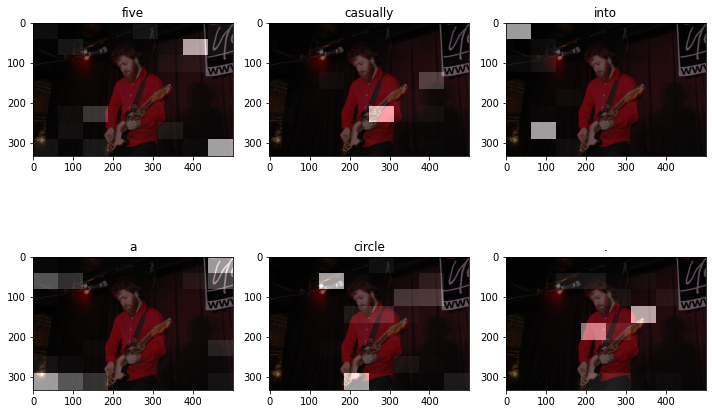

Prediction Greedy Caption: a teams of divers are standing next to a bike .


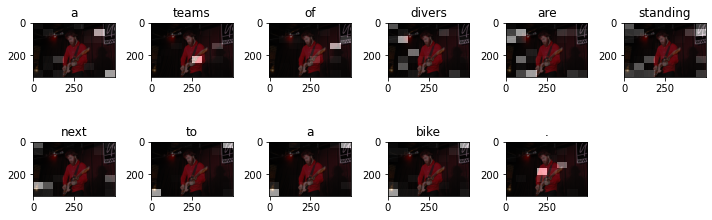

Prediction Beam Caption: two teams in purple shirts are walking through the air .


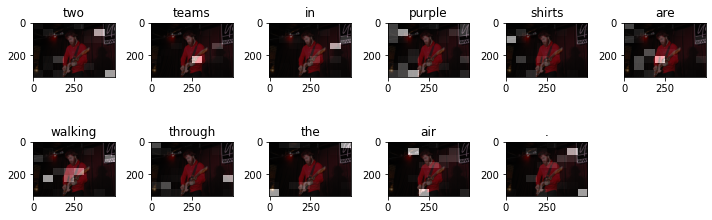

In [67]:
# captions on the validation set
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]

real_caption = tf.compat.as_text(cap_val[rid].numpy())
result, attention_plot = evaluate(image)
greedy_result, greedy_attention_plot = evaluate(image, 'greedy')
beam_result, beam_attention_plot = beam_search(image)

print('Real Caption:', real_caption)
print('Prediction Categorical Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)
print('Prediction Greedy Caption:', ' '.join(greedy_result))
plot_attention(image, greedy_result, greedy_attention_plot)
print('Prediction Beam Caption:', ' '.join(beam_result))
plot_attention(image, beam_result, beam_attention_plot)

#### LSTM results:

In [68]:
decoder = RNN_Decoder(embedding_dim, units, vocabulary_size, False)

In [69]:
train_model()

Epoch 1 Batch 0 Loss 7.4095
Epoch 1 Batch 100 Loss 3.1502
Epoch 1 Batch 200 Loss 3.0317
Epoch 1 Loss 3.142779
Time taken for 1 epoch 182.83 sec

Epoch 2 Batch 0 Loss 2.7826
Epoch 2 Batch 100 Loss 2.5785
Epoch 2 Batch 200 Loss 2.3787
Epoch 2 Loss 2.574031
Time taken for 1 epoch 180.89 sec

Epoch 3 Batch 0 Loss 2.5177
Epoch 3 Batch 100 Loss 2.3569
Epoch 3 Batch 200 Loss 2.4732
Epoch 3 Loss 2.411659
Time taken for 1 epoch 178.81 sec

Epoch 4 Batch 0 Loss 2.3000
Epoch 4 Batch 100 Loss 2.4021
Epoch 4 Batch 200 Loss 2.3366
Epoch 4 Loss 2.311948
Time taken for 1 epoch 180.23 sec

Epoch 5 Batch 0 Loss 2.2173
Epoch 5 Batch 100 Loss 2.1254
Epoch 5 Batch 200 Loss 2.3101
Epoch 5 Loss 2.224474
Time taken for 1 epoch 201.91 sec

Epoch 6 Batch 0 Loss 2.1711
Epoch 6 Batch 100 Loss 2.0631
Epoch 6 Batch 200 Loss 2.0591
Epoch 6 Loss 2.145084
Time taken for 1 epoch 181.76 sec

Epoch 7 Batch 0 Loss 2.1841
Epoch 7 Batch 100 Loss 1.9825
Epoch 7 Batch 200 Loss 2.0414
Epoch 7 Loss 2.071017
Time taken for 1 epo

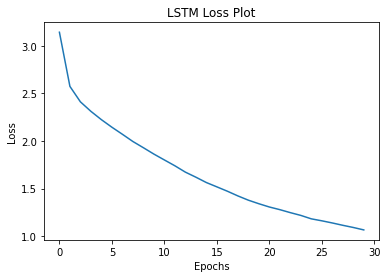

In [70]:
plt.plot(lstm_loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('LSTM Loss Plot')
plt.show()

Real Captions - References:
['a', 'man', 'in', 'a', 'gray', 'shirt', 'sitting', 'in', 'a', 'field', 'of', 'flowers']
['the', 'man', 'is', 'in', 'a', 'field', 'of', 'tulips']
['a', 'group', 'of', 'children', 'dressed', 'for', 'halloween', 'stand', 'in', 'line', 'with', 'the', 'exception', 'of', 'one', 'girl']
['a', 'blond', 'girl', 'in', 'a', 'black', 'cape', 'stands', 'with', 'other', 'children', 'in', 'costumes']
Prediction - Hypothesis:
['a', 'woman', 'with', 'a', 'tan', 'dog', 'looks', 'taking', 'pictures', 'watching', 'him']
Sentence BLEU Score = 0.03578101126480633



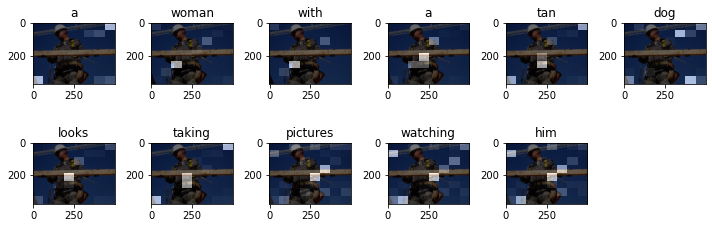


Real Captions - References:
['a', 'man', 'in', 'a', 'gray', 'shirt', 'sitting', 'in', 'a', 'field', 'of', 'flowers']
['the', 'man', 'is', 'in', 'a', 'field', 'of', 'tulips']
['a', 'group', 'of', 'children', 'dressed', 'for', 'halloween', 'stand', 'in', 'line', 'with', 'the', 'exception', 'of', 'one', 'girl']
['a', 'blond', 'girl', 'in', 'a', 'black', 'cape', 'stands', 'with', 'other', 'children', 'in', 'costumes']
Prediction - Hypothesis:
['a', 'man', 'in', 'a', 'white', 'uniform', 'plays', 'a', 'basket', 'while', 'another', 'little', 'boy']
Sentence BLEU Score = 0.2542846388265561



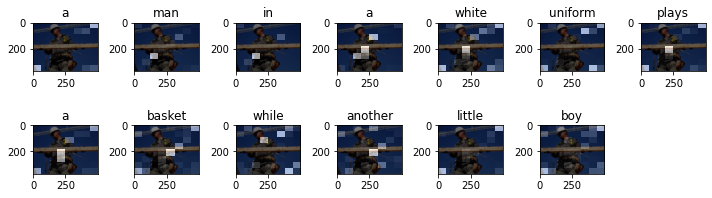


Real Captions - References:
['a', 'man', 'in', 'a', 'gray', 'shirt', 'sitting', 'in', 'a', 'field', 'of', 'flowers']
['the', 'man', 'is', 'in', 'a', 'field', 'of', 'tulips']
['a', 'group', 'of', 'children', 'dressed', 'for', 'halloween', 'stand', 'in', 'line', 'with', 'the', 'exception', 'of', 'one', 'girl']
['a', 'blond', 'girl', 'in', 'a', 'black', 'cape', 'stands', 'with', 'other', 'children', 'in', 'costumes']
Prediction - Hypothesis:
['a', 'woman', 'wearing', 'a', 'beard', 'bending', 'a', 'stove']
Sentence BLEU Score = 0.05630615150681703



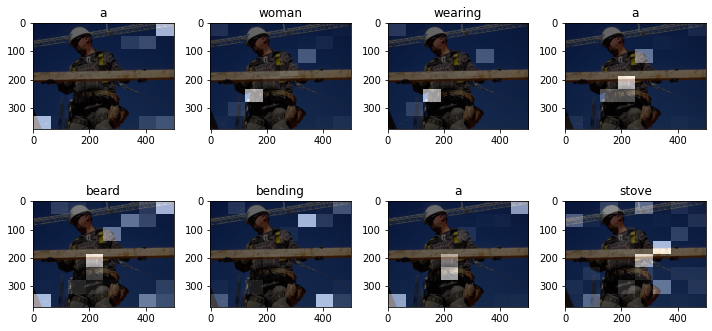


Real Captions - References:
['three', 'men', 'wearing', 'uniforms', 'are', 'standing', 'on', 'a', 'sidewalk']
['three', 'men', 'wearing', 'red', 'prevention', 'vests', 'stand', 'ready']
['men', 'in', 'red', 'vests', 'watching', 'street', 'corner']
['a', 'flight', 'attendant', 'showing', 'passengers', 'how', 'to', 'use', 'the', 'airplane', 'safety', 'vest']
Prediction - Hypothesis:
['a', 'group', 'of', 'people', 'are', 'in', 'matching', 'blanket', 'reflection', 'on', 'a', 'sidewalk', 'in', 'a', 'sign', 'during', 'the', 'store']
Sentence BLEU Score = 0.1180029047405979



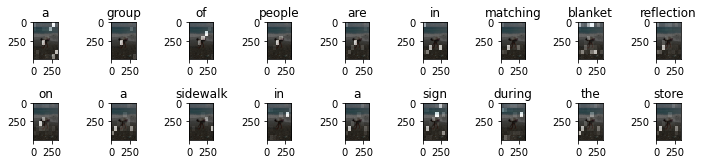


Real Captions - References:
['three', 'men', 'wearing', 'uniforms', 'are', 'standing', 'on', 'a', 'sidewalk']
['three', 'men', 'wearing', 'red', 'prevention', 'vests', 'stand', 'ready']
['men', 'in', 'red', 'vests', 'watching', 'street', 'corner']
['a', 'flight', 'attendant', 'showing', 'passengers', 'how', 'to', 'use', 'the', 'airplane', 'safety', 'vest']
Prediction - Hypothesis:
['a', 'group', 'of', 'people', 'in', 'a', 'blue', 'leotard', 'hula', 'hoop', 'on', 'a', 'busy', 'street']
Sentence BLEU Score = 0.06733087507031198



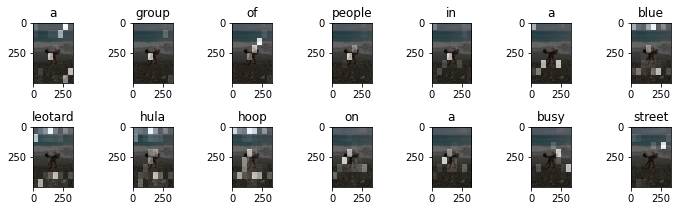


Real Captions - References:
['three', 'men', 'wearing', 'uniforms', 'are', 'standing', 'on', 'a', 'sidewalk']
['three', 'men', 'wearing', 'red', 'prevention', 'vests', 'stand', 'ready']
['men', 'in', 'red', 'vests', 'watching', 'street', 'corner']
['a', 'flight', 'attendant', 'showing', 'passengers', 'how', 'to', 'use', 'the', 'airplane', 'safety', 'vest']
Prediction - Hypothesis:
['a', 'group', 'of', 'people', 'are', 'standing', 'on', 'a', 'city', 'plaza']
Sentence BLEU Score = 0.31100388762484404



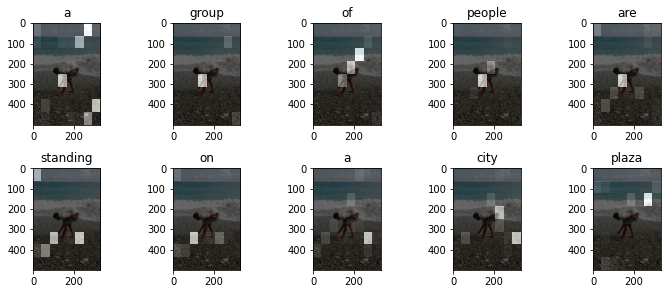


Real Captions - References:
['three', 'young', 'blond', 'girls', 'wearing', 'brightly', 'colored', 'clothes', 'are', 'having', 'fun', 'outdoors', 'under', 'a', 'rainbow', 'colored', 'umbrella']
['three', 'children', 'play', 'on', 'the', 'grass', 'under', 'a', 'multicolored', 'umbrella', 'and', 'wearing', 'rainbow', 'colored', 'outfits']
['kids', 'in', 'colorful', 'clothing', 'relax', 'on', 'the', 'grass', 'under', 'a', 'multicolored', 'umbrella']
['three', 'girls', 'playing', 'and', 'smiling', 'on', 'the', 'grass', 'under', 'an', 'umbrella']
['children', 'sitting', 'on', 'the', 'grass', 'and', 'covered', 'with', 'a', 'umbrella']
Prediction - Hypothesis:
['a', 'brown', 'and', 'baggy', 'dog', 'running', 'down', 'a', 'wall']
Sentence BLEU Score = 0.0373850807395143



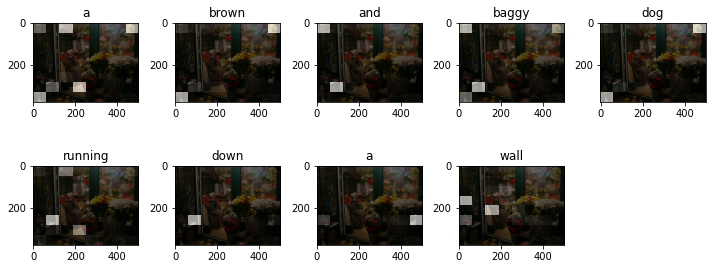


Real Captions - References:
['three', 'young', 'blond', 'girls', 'wearing', 'brightly', 'colored', 'clothes', 'are', 'having', 'fun', 'outdoors', 'under', 'a', 'rainbow', 'colored', 'umbrella']
['three', 'children', 'play', 'on', 'the', 'grass', 'under', 'a', 'multicolored', 'umbrella', 'and', 'wearing', 'rainbow', 'colored', 'outfits']
['kids', 'in', 'colorful', 'clothing', 'relax', 'on', 'the', 'grass', 'under', 'a', 'multicolored', 'umbrella']
['three', 'girls', 'playing', 'and', 'smiling', 'on', 'the', 'grass', 'under', 'an', 'umbrella']
['children', 'sitting', 'on', 'the', 'grass', 'and', 'covered', 'with', 'a', 'umbrella']
Prediction - Hypothesis:
['a', 'dog', 'leaps', 'through', 'a', 'tree']
Sentence BLEU Score = 0.02638728575633371



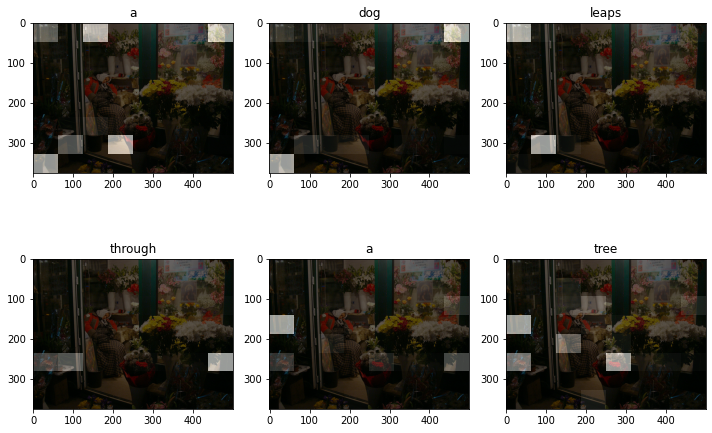


Real Captions - References:
['three', 'young', 'blond', 'girls', 'wearing', 'brightly', 'colored', 'clothes', 'are', 'having', 'fun', 'outdoors', 'under', 'a', 'rainbow', 'colored', 'umbrella']
['three', 'children', 'play', 'on', 'the', 'grass', 'under', 'a', 'multicolored', 'umbrella', 'and', 'wearing', 'rainbow', 'colored', 'outfits']
['kids', 'in', 'colorful', 'clothing', 'relax', 'on', 'the', 'grass', 'under', 'a', 'multicolored', 'umbrella']
['three', 'girls', 'playing', 'and', 'smiling', 'on', 'the', 'grass', 'under', 'an', 'umbrella']
['children', 'sitting', 'on', 'the', 'grass', 'and', 'covered', 'with', 'a', 'umbrella']
Prediction - Hypothesis:
['the', 'brown', 'dog', 'leaps', 'across', 'a', 'wooden', 'floor']
Sentence BLEU Score = 0.03728599358154633



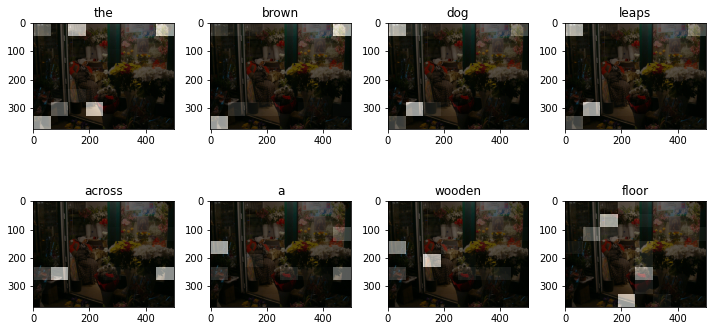


Real Captions - References:
['a', 'young', 'girl', 'contorts', 'her', 'body', 'during', 'a', 'performance']
['woman', 'performing', 'some', 'type', 'of', 'dance', 'move']
['a', 'young', 'girl', 'with', 'blondhair', 'and', 'a', 'green', 'shirt', 'plays', 'jump', 'rope']
['a', 'young', 'blond', 'girl', 'in', 'a', 'green', 'shirt', 'holding', 'something']
['a', 'young', 'girl', 'with', 'a', 'green', 'tshirt', 'and', 'blondhair']
Prediction - Hypothesis:
['a', 'man', 'and', 'a', 'female', 'walking', 'away', 'from', 'a', 'busy', 'street']
Sentence BLEU Score = 0.07818688792494147



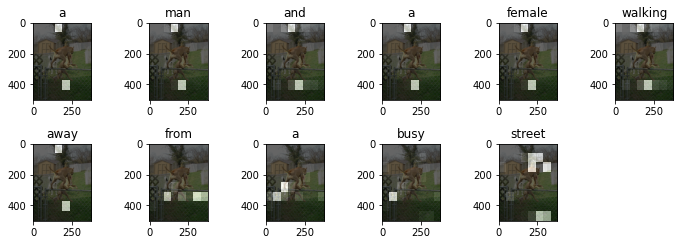


Real Captions - References:
['a', 'young', 'girl', 'contorts', 'her', 'body', 'during', 'a', 'performance']
['woman', 'performing', 'some', 'type', 'of', 'dance', 'move']
['a', 'young', 'girl', 'with', 'blondhair', 'and', 'a', 'green', 'shirt', 'plays', 'jump', 'rope']
['a', 'young', 'blond', 'girl', 'in', 'a', 'green', 'shirt', 'holding', 'something']
['a', 'young', 'girl', 'with', 'a', 'green', 'tshirt', 'and', 'blondhair']
Prediction - Hypothesis:
['a', 'boy', 'pushes', 'a', 'man', 'in', 'a', 'wooded', 'area']
Sentence BLEU Score = 0.09803694489756798



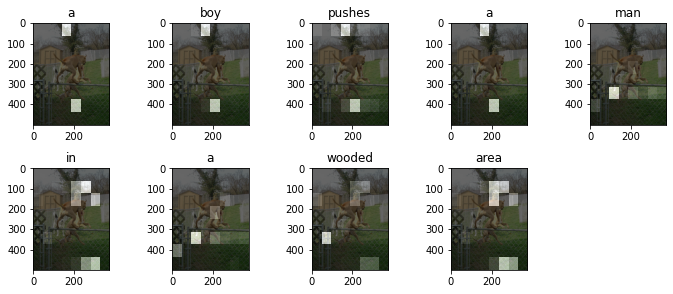


Real Captions - References:
['a', 'young', 'girl', 'contorts', 'her', 'body', 'during', 'a', 'performance']
['woman', 'performing', 'some', 'type', 'of', 'dance', 'move']
['a', 'young', 'girl', 'with', 'blondhair', 'and', 'a', 'green', 'shirt', 'plays', 'jump', 'rope']
['a', 'young', 'blond', 'girl', 'in', 'a', 'green', 'shirt', 'holding', 'something']
['a', 'young', 'girl', 'with', 'a', 'green', 'tshirt', 'and', 'blondhair']
Prediction - Hypothesis:
['a', 'girl', 'pushes', 'a', 'sign']
Sentence BLEU Score = 0.06782619583370925



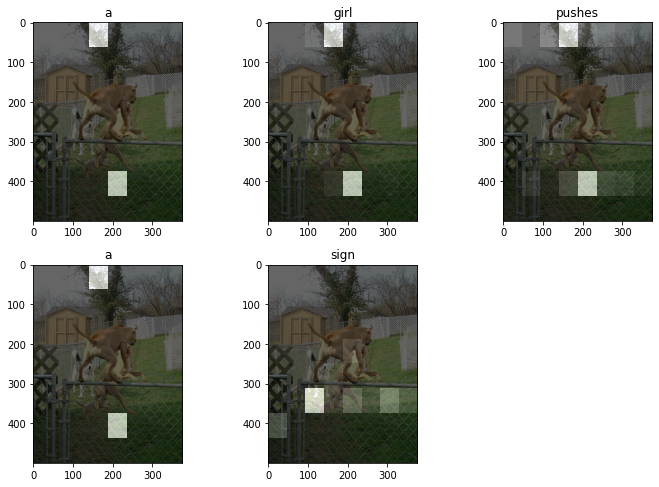


Real Captions - References:
['a', 'blondhaired', 'girl', 'is', 'wearing', 'a', 'purple', 'top', 'yellow', 'pants', 'different', 'colored', 'socks', 'and', 'shoes']
['a', 'little', 'girl', 'with', 'a', 'purple', 'shirt', 'looks', 'over', 'the', 'rail']
['a', 'child', 'in', 'a', 'purple', 'shirt', 'stares', 'over', 'a', 'metal', 'railing']
['little', 'girl', 'leaning', 'on', 'guard', 'rail']
Prediction - Hypothesis:
['a', 'man', 'meditating', 'a', 'crowd']
Sentence BLEU Score = 0.0704400818994



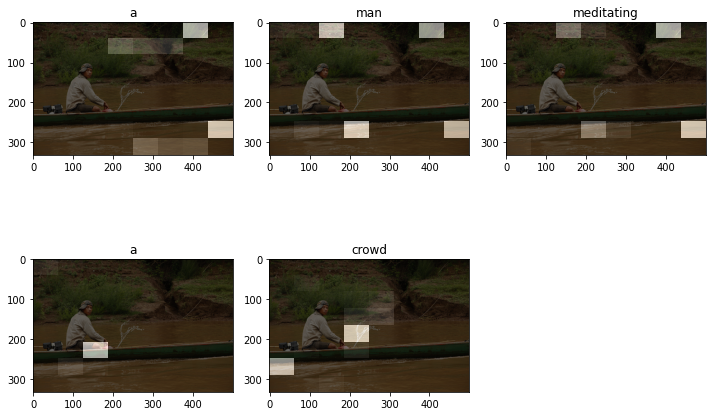


Real Captions - References:
['a', 'blondhaired', 'girl', 'is', 'wearing', 'a', 'purple', 'top', 'yellow', 'pants', 'different', 'colored', 'socks', 'and', 'shoes']
['a', 'little', 'girl', 'with', 'a', 'purple', 'shirt', 'looks', 'over', 'the', 'rail']
['a', 'child', 'in', 'a', 'purple', 'shirt', 'stares', 'over', 'a', 'metal', 'railing']
['little', 'girl', 'leaning', 'on', 'guard', 'rail']
Prediction - Hypothesis:
['a', 'man', 'is', 'about', 'to', 'make']
Sentence BLEU Score = 0.06781665629871014



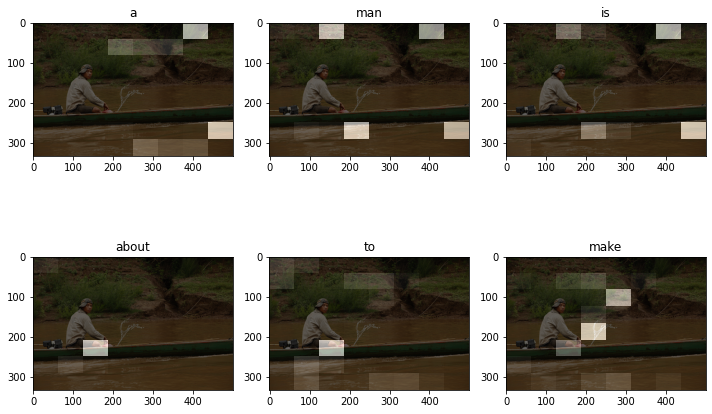


Real Captions - References:
['a', 'blondhaired', 'girl', 'is', 'wearing', 'a', 'purple', 'top', 'yellow', 'pants', 'different', 'colored', 'socks', 'and', 'shoes']
['a', 'little', 'girl', 'with', 'a', 'purple', 'shirt', 'looks', 'over', 'the', 'rail']
['a', 'child', 'in', 'a', 'purple', 'shirt', 'stares', 'over', 'a', 'metal', 'railing']
['little', 'girl', 'leaning', 'on', 'guard', 'rail']
Prediction - Hypothesis:
['a', 'man', 'in', 'an', 'apron']
Sentence BLEU Score = 0.0704400818994



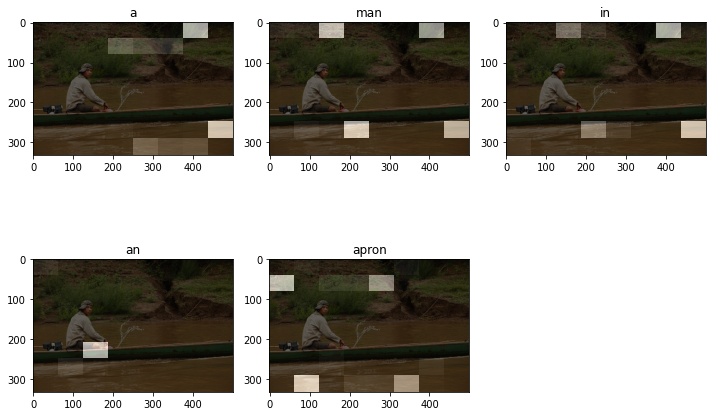


Real Captions - References:
['a', 'group', 'of', 'people', 'working', 'on', 'computers', 'in', 'a', 'large', 'rectangle', 'room']
['two', 'females', 'one', 'in', 'a', 'dark', 'blue', 'shirt', 'and', 'the', 'other', 'in', 'a', 'white', 'shirt', 'are', 'playing', 'lacrosse']
['a', 'female', 'lacrosse', 'player', 'in', 'blue', 'chasing', 'another', 'in', 'white', 'who', 'is', 'moving', 'away', 'with', 'the', 'ball']
['two', 'girls', 'compete', 'over', 'the', 'ball', 'while', 'playing', 'lacrosse']
Prediction - Hypothesis:
['a', 'group', 'of', 'motorcycle', 'star', 'looks', 'through', 'a', 'bench', 'next', 'to', 'a', 'picture', 'face', 'and', 'smiling', 'while', 'on', 'a']
Sentence BLEU Score = 0.11851224912804187



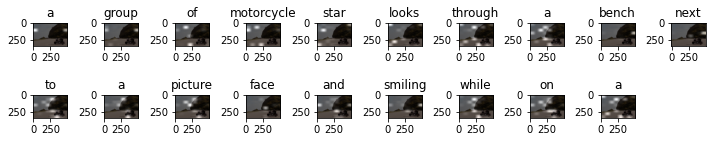


Real Captions - References:
['a', 'group', 'of', 'people', 'working', 'on', 'computers', 'in', 'a', 'large', 'rectangle', 'room']
['two', 'females', 'one', 'in', 'a', 'dark', 'blue', 'shirt', 'and', 'the', 'other', 'in', 'a', 'white', 'shirt', 'are', 'playing', 'lacrosse']
['a', 'female', 'lacrosse', 'player', 'in', 'blue', 'chasing', 'another', 'in', 'white', 'who', 'is', 'moving', 'away', 'with', 'the', 'ball']
['two', 'girls', 'compete', 'over', 'the', 'ball', 'while', 'playing', 'lacrosse']
Prediction - Hypothesis:
['a', 'man', 'is', 'dancing', 'in', 'a', 'field', 'near', 'a', 'man']
Sentence BLEU Score = 0.09759407278293647



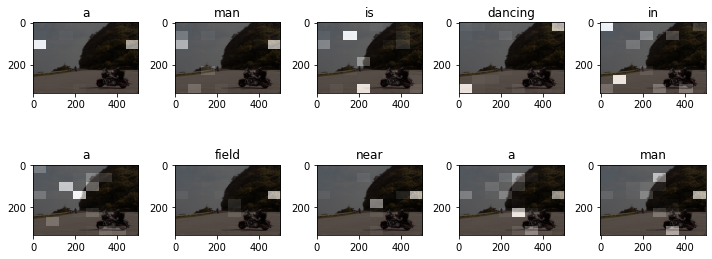


Real Captions - References:
['a', 'group', 'of', 'people', 'working', 'on', 'computers', 'in', 'a', 'large', 'rectangle', 'room']
['two', 'females', 'one', 'in', 'a', 'dark', 'blue', 'shirt', 'and', 'the', 'other', 'in', 'a', 'white', 'shirt', 'are', 'playing', 'lacrosse']
['a', 'female', 'lacrosse', 'player', 'in', 'blue', 'chasing', 'another', 'in', 'white', 'who', 'is', 'moving', 'away', 'with', 'the', 'ball']
['two', 'girls', 'compete', 'over', 'the', 'ball', 'while', 'playing', 'lacrosse']
Prediction - Hypothesis:
['a', 'man', 'is', 'dancing', 'in', 'the', 'grass']
Sentence BLEU Score = 0.05562311003053509



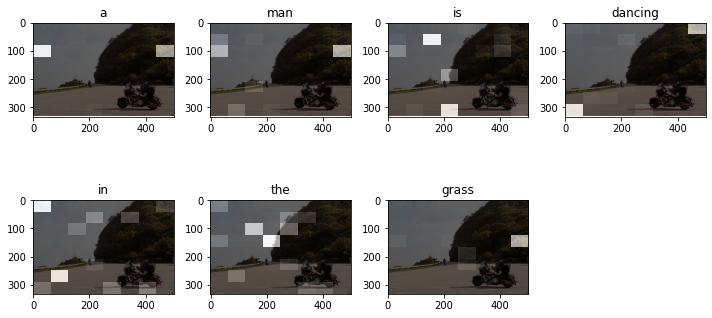


Real Captions - References:
['two', 'men', 'take', 'part', 'in', 'a', 'karate', 'demonstration', 'while', 'a', 'crowd', 'looks', 'on']
['two', 'men', 'are', 'instructing', 'others', 'in', 'martial', 'arts']
['man', 'and', 'a', 'woman', 'sitting', 'in', 'black', 'chairs', 'drinking']
['a', 'man', 'and', 'women', 'sip', 'drinks', 'in', 'two', 'leather', 'chairs']
Prediction - Hypothesis:
['people', 'in', 'tights', 'walks', 'his', 'head']
Sentence BLEU Score = 0.03682642386583652



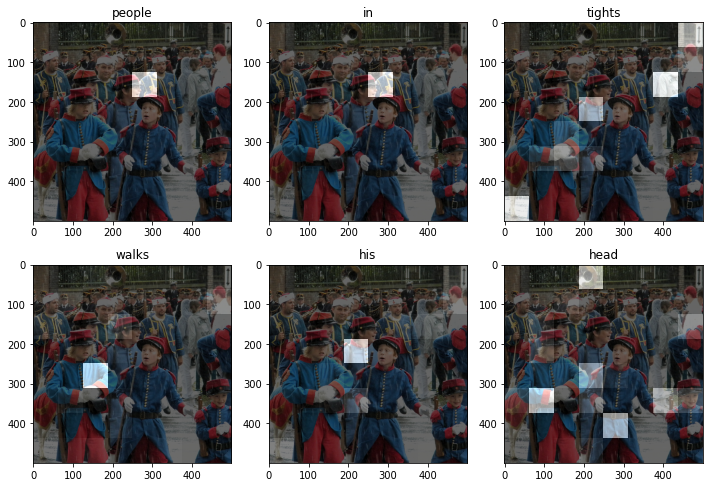


Real Captions - References:
['two', 'men', 'take', 'part', 'in', 'a', 'karate', 'demonstration', 'while', 'a', 'crowd', 'looks', 'on']
['two', 'men', 'are', 'instructing', 'others', 'in', 'martial', 'arts']
['man', 'and', 'a', 'woman', 'sitting', 'in', 'black', 'chairs', 'drinking']
['a', 'man', 'and', 'women', 'sip', 'drinks', 'in', 'two', 'leather', 'chairs']
Prediction - Hypothesis:
['a', 'man', 'in', 'a', 'tattoo']
Sentence BLEU Score = 0.15304637814662614



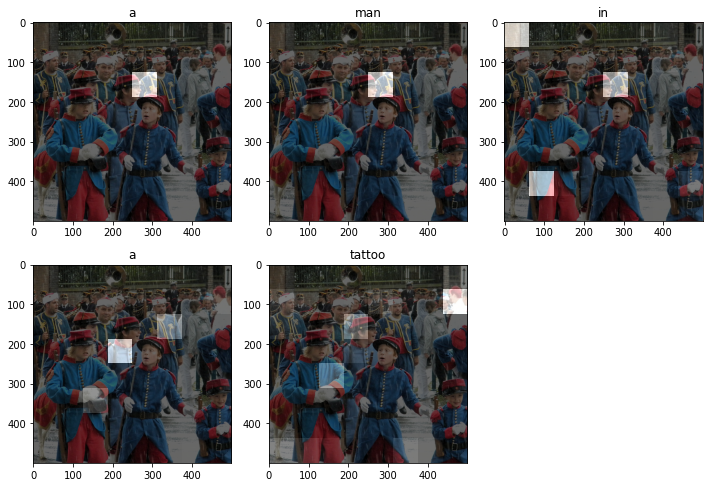


Real Captions - References:
['two', 'men', 'take', 'part', 'in', 'a', 'karate', 'demonstration', 'while', 'a', 'crowd', 'looks', 'on']
['two', 'men', 'are', 'instructing', 'others', 'in', 'martial', 'arts']
['man', 'and', 'a', 'woman', 'sitting', 'in', 'black', 'chairs', 'drinking']
['a', 'man', 'and', 'women', 'sip', 'drinks', 'in', 'two', 'leather', 'chairs']
Prediction - Hypothesis:
['an', 'older', 'women', 'selling', 'tehelka']
Sentence BLEU Score = 0.03578409690162651



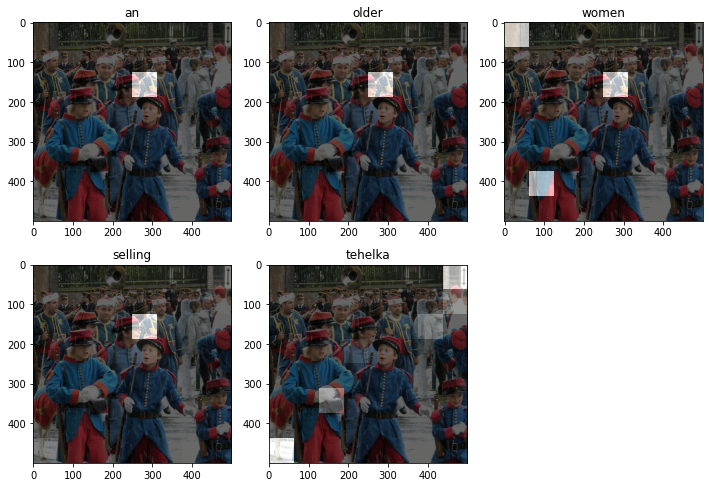

In [71]:
get_image_blue(0, "categorical")
get_image_blue(0, "greedy")
get_image_blue(0, "beam search")
get_image_blue(5, "categorical")
get_image_blue(5, "greedy")
get_image_blue(5, "beam search")
get_image_blue(10, "categorical")
get_image_blue(10, "greedy")
get_image_blue(10, "beam search")
get_image_blue(20, "categorical")
get_image_blue(20, "greedy")
get_image_blue(20, "beam search")
get_image_blue(105, "categorical")
get_image_blue(105, "greedy")
get_image_blue(105, "beam search")
get_image_blue(150, "categorical")
get_image_blue(150, "greedy")
get_image_blue(150, "beam search")
get_image_blue(190, "categorical")
get_image_blue(190, "greedy")
get_image_blue(190, "beam search")

In [67]:
get_vocab_blue(100, "categorical")

get_vocab_blue(100, "greedy")

get_vocab_blue(100, "beam search")

Corpus BLEU Score categorical:  0.2454668561838021
Corpus BLEU Score greedy:  0.27886892325645102
Corpus BLEU Score beam search:  0.25986986146442584


Real Caption: * a boy squirts a squirt gun . @ @ @ @ @ @ @ @ @ @ @ @
Prediction Categorical Caption: a child trying to seen to be served a professional team celebrating after flea the nba colored bear .


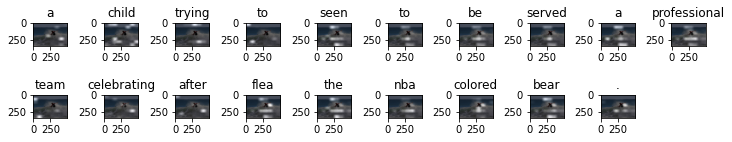

Prediction Greedy Caption: a woman in a backpack looking into the shadows .


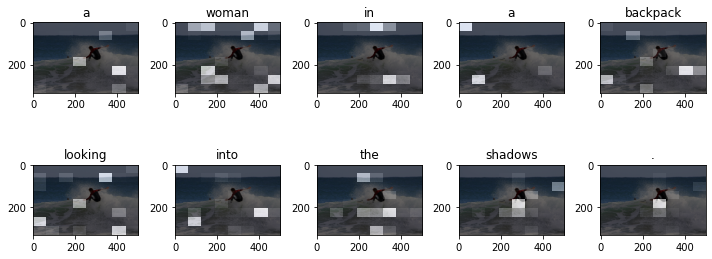

Prediction Beam Caption: an older man in a backpack are standing in the sea boats at night .


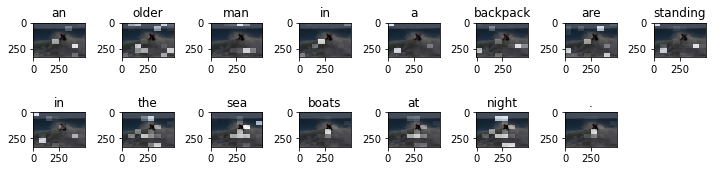

In [73]:
# captions on the validation set
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]

real_caption = tf.compat.as_text(cap_val[rid].numpy())
result, attention_plot = evaluate(image)
greedy_result, greedy_attention_plot = evaluate(image, 'greedy')
beam_result, beam_attention_plot = beam_search(image)

print('Real Caption:', real_caption)
print('Prediction Categorical Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)
print('Prediction Greedy Caption:', ' '.join(greedy_result))
plot_attention(image, greedy_result, greedy_attention_plot)
print('Prediction Beam Caption:', ' '.join(beam_result))
plot_attention(image, beam_result, beam_attention_plot)

### units 256

In [ ]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000
embedding_dim = 100
units = 256 
num_steps = len(img_name_train) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (49, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 49

### GRU RESULTS

In [43]:
encoder = CNN_Encoder(embedding_dim)
# decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size())
decoder = RNN_Decoder(embedding_dim, units, vocabulary_size)

In [68]:
train_model()


Epoch 1 Batch 0 Loss 7.3895
Epoch 1 Batch 100 Loss 3.4947
Epoch 1 Batch 200 Loss 3.3699
Epoch 1 Batch 300 Loss 3.0770
Epoch 1 Loss 3.399814
Time taken for 1 epoch 146.11 sec

Epoch 2 Batch 0 Loss 2.9102
Epoch 2 Batch 100 Loss 2.6933
Epoch 2 Batch 200 Loss 2.6960
Epoch 2 Batch 300 Loss 2.7434
Epoch 2 Loss 2.668083
Time taken for 1 epoch 147.37 sec

Epoch 3 Batch 0 Loss 2.4917
Epoch 3 Batch 100 Loss 2.4128
Epoch 3 Batch 200 Loss 2.6934
Epoch 3 Batch 300 Loss 2.2042
Epoch 3 Loss 2.422798
Time taken for 1 epoch 148.09 sec

Epoch 4 Batch 0 Loss 2.3047
Epoch 4 Batch 100 Loss 2.1191
Epoch 4 Batch 200 Loss 2.3224
Epoch 4 Batch 300 Loss 2.0260
Epoch 4 Loss 2.268354
Time taken for 1 epoch 149.77 sec

Epoch 5 Batch 0 Loss 2.3450
Epoch 5 Batch 100 Loss 2.1311
Epoch 5 Batch 200 Loss 2.1396
Epoch 5 Batch 300 Loss 2.3024
Epoch 5 Loss 2.150806
Time taken for 1 epoch 201.91 sec

Epoch 6 Batch 0 Loss 1.9861
Epoch 6 Batch 100 Loss 2.0784
Epoch 6 Batch 200 Loss 1.9608
Epoch 6 Batch 300 Loss 1.9861
Epoch 

Real Captions - References:
['young', 'boy', 'and', 'girl', 'squeeze', 'tubes', 'of', 'frosting', 'onto', 'cupcakes', 'with', 'adults', 'around', 'them']
['two', 'little', 'kids', 'are', 'decorating', 'cupcakes', 'with', 'tubes', 'of', 'frosting']
['a', 'boy', 'and', 'girl', 'putting', 'frosting', 'on', 'cupcake']
['two', 'children', 'icing', 'their', 'cupcakes']
['two', 'children', 'decorate', 'cupcakes']
Prediction - Hypothesis:
['a', 'teenage', 'pretending', 'in', 'a', 'chocolate', 'looks', 'fixing', 'a', 'bathtub']
Sentence BLEU Score = 0.028093085811869447



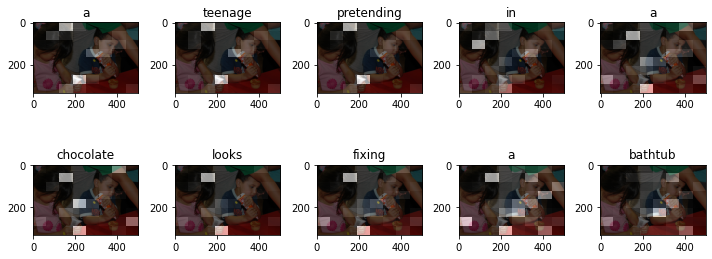


Real Captions - References:
['young', 'boy', 'and', 'girl', 'squeeze', 'tubes', 'of', 'frosting', 'onto', 'cupcakes', 'with', 'adults', 'around', 'them']
['two', 'little', 'kids', 'are', 'decorating', 'cupcakes', 'with', 'tubes', 'of', 'frosting']
['a', 'boy', 'and', 'girl', 'putting', 'frosting', 'on', 'cupcake']
['two', 'children', 'icing', 'their', 'cupcakes']
['two', 'children', 'decorate', 'cupcakes']
Prediction - Hypothesis:
['a', 'young', 'girl', 'in', 'a', 'white', 'dress', 'is', 'eating']
Sentence BLEU Score = 0.04913486520648141



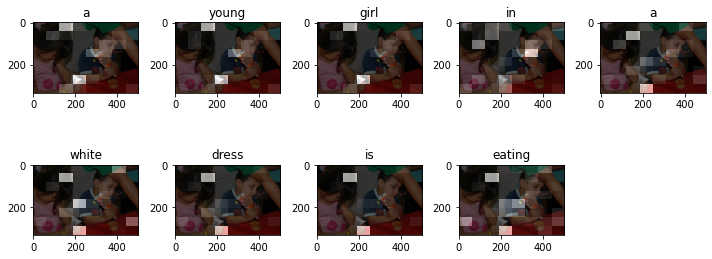


Real Captions - References:
['young', 'boy', 'and', 'girl', 'squeeze', 'tubes', 'of', 'frosting', 'onto', 'cupcakes', 'with', 'adults', 'around', 'them']
['two', 'little', 'kids', 'are', 'decorating', 'cupcakes', 'with', 'tubes', 'of', 'frosting']
['a', 'boy', 'and', 'girl', 'putting', 'frosting', 'on', 'cupcake']
['two', 'children', 'icing', 'their', 'cupcakes']
['two', 'children', 'decorate', 'cupcakes']
Prediction - Hypothesis:
['a', 'young', 'girl', 'in', 'a', 'pink', 'dress']
Sentence BLEU Score = 0.057190229840165294



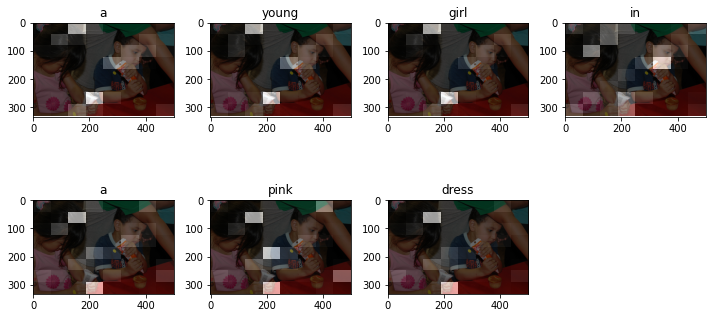


Real Captions - References:
['many', 'people', 'stand', 'by', 'as', 'a', 'man', 'cuts', 'a', 'piece', 'of', 'plywood', 'at', 'a', 'construction', 'site']
['a', 'group', 'of', 'people', 'outside', 'with', 'boards', 'and', 'construction', 'tools']
['a', 'man', 'measures', 'wood', 'while', 'a', 'group', 'of', 'people', 'looks', 'on']
['eight', 'people', 'gathered', 'around', 'a', 'man', 'cutting', 'some', 'wood']
Prediction - Hypothesis:
['a', 'man', 'are', 'gathering', 'america', 'area']
Sentence BLEU Score = 0.08207088793277538



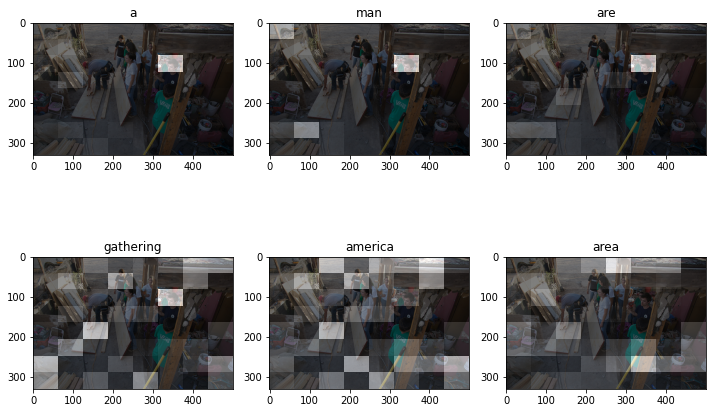


Real Captions - References:
['many', 'people', 'stand', 'by', 'as', 'a', 'man', 'cuts', 'a', 'piece', 'of', 'plywood', 'at', 'a', 'construction', 'site']
['a', 'group', 'of', 'people', 'outside', 'with', 'boards', 'and', 'construction', 'tools']
['a', 'man', 'measures', 'wood', 'while', 'a', 'group', 'of', 'people', 'looks', 'on']
['eight', 'people', 'gathered', 'around', 'a', 'man', 'cutting', 'some', 'wood']
Prediction - Hypothesis:
['a', 'man', 'are', 'working', 'on', 'a', 'large', 'outdoor']
Sentence BLEU Score = 0.1112357862739652



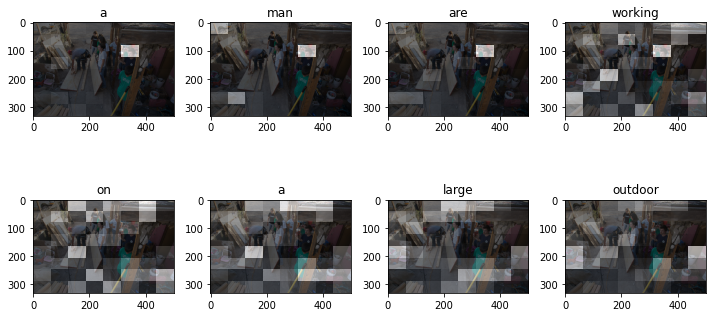


Real Captions - References:
['many', 'people', 'stand', 'by', 'as', 'a', 'man', 'cuts', 'a', 'piece', 'of', 'plywood', 'at', 'a', 'construction', 'site']
['a', 'group', 'of', 'people', 'outside', 'with', 'boards', 'and', 'construction', 'tools']
['a', 'man', 'measures', 'wood', 'while', 'a', 'group', 'of', 'people', 'looks', 'on']
['eight', 'people', 'gathered', 'around', 'a', 'man', 'cutting', 'some', 'wood']
Prediction - Hypothesis:
['a', 'man', 'in', 'a', 'tarp']
Sentence BLEU Score = 0.09071511735170473



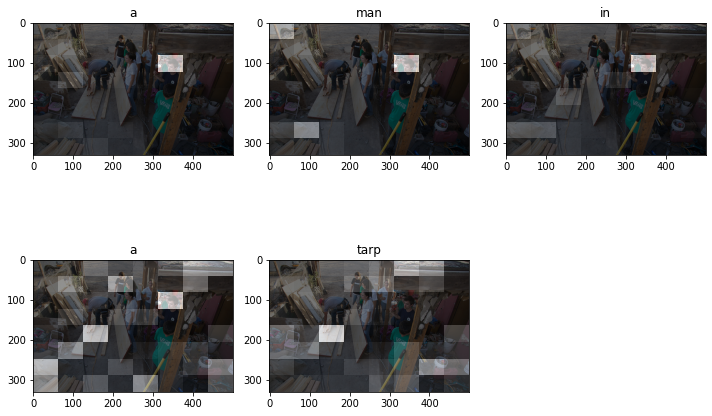


Real Captions - References:
['a', 'man', 'is', 'parking', 'his', 'bicycle', 'outside', 'a', 'building', 'next', 'to', 'a', 'statue', 'of', 'a', 'man', "'s", 'head']
['male', 'wearing', 'a', 'helmet', 'and', 'backpack', 'holding', 'his', 'bike', 'up', 'in', 'front', 'of', 'a', 'store']
['a', 'man', 'walks', 'his', 'bike', 'past', 'a', 'large', 'silver', 'sculpture', 'of', 'a', 'head']
['a', 'man', 'stopping', 'with', 'his', 'bike', 'by', 'a', 'strange', 'statue']
Prediction - Hypothesis:
['blond', 'woman', 'worked', 'riding', 'a', 'bite', 'he', 'working', 'on', 'stilts', 'near', 'a', 'sidewalk']
Sentence BLEU Score = 0.027720543852549757



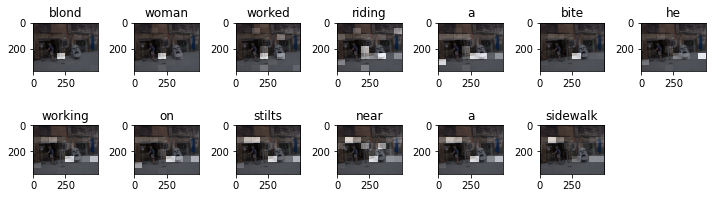


Real Captions - References:
['a', 'man', 'is', 'parking', 'his', 'bicycle', 'outside', 'a', 'building', 'next', 'to', 'a', 'statue', 'of', 'a', 'man', "'s", 'head']
['male', 'wearing', 'a', 'helmet', 'and', 'backpack', 'holding', 'his', 'bike', 'up', 'in', 'front', 'of', 'a', 'store']
['a', 'man', 'walks', 'his', 'bike', 'past', 'a', 'large', 'silver', 'sculpture', 'of', 'a', 'head']
['a', 'man', 'stopping', 'with', 'his', 'bike', 'by', 'a', 'strange', 'statue']
Prediction - Hypothesis:
['a', 'woman', 'in', 'a', 'white', 'hat', 'is', 'pushing', 'a', 'red', 'white', 'dress', 'is', 'walking', 'past', 'a', 'building']
Sentence BLEU Score = 0.08370504621923014



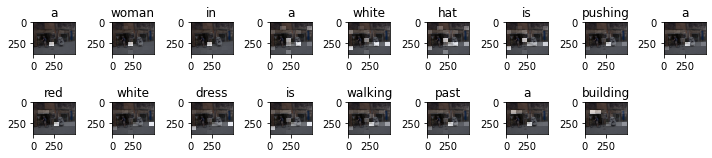


Real Captions - References:
['a', 'man', 'is', 'parking', 'his', 'bicycle', 'outside', 'a', 'building', 'next', 'to', 'a', 'statue', 'of', 'a', 'man', "'s", 'head']
['male', 'wearing', 'a', 'helmet', 'and', 'backpack', 'holding', 'his', 'bike', 'up', 'in', 'front', 'of', 'a', 'store']
['a', 'man', 'walks', 'his', 'bike', 'past', 'a', 'large', 'silver', 'sculpture', 'of', 'a', 'head']
['a', 'man', 'stopping', 'with', 'his', 'bike', 'by', 'a', 'strange', 'statue']
Prediction - Hypothesis:
['a', 'woman', 'in', 'a', 'white', 'dress', 'is', 'driving', 'a', 'newspaper', 'on', 'a', 'street']
Sentence BLEU Score = 0.04301800328410597



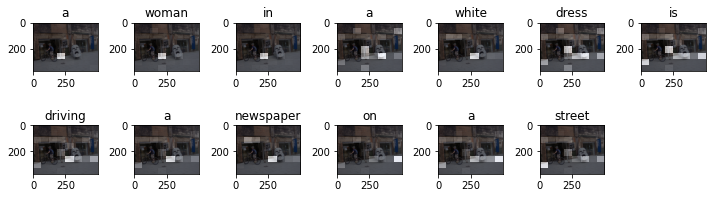


Real Captions - References:
['a', 'woman', 'holding', 'a', 'little', 'girls', 'hand', 'is', 'pointing', 'to', 'something', 'trying', 'to', 'show', 'her']
['asian', 'woman', 'holds', 'little', 'girl', "'s", 'hand', 'in', 'parklike', 'area', 'points', 'offcamera']
['a', 'woman', 'holds', 'the', 'hand', 'of', 'a', 'small', 'girl', 'and', 'points', 'towards', 'the', 'bushes']
['an', 'older', 'asian', 'lady', 'holding', 'the', 'hand', 'of', 'a', 'little', 'asian', 'girl']
['the', 'woman', 'is', 'holding', 'the', 'girls', 'hand', 'near', 'a', 'bush']
Prediction - Hypothesis:
['a', 'woman', 'with', 'a', 'blue', 'and', 'white', 'and', 'gray', 'shirt', 'is', 'riding', 'a', 'gate', 'of', 'a', 'cigarette', 'in', 'the']
Sentence BLEU Score = 0.07887874988486548



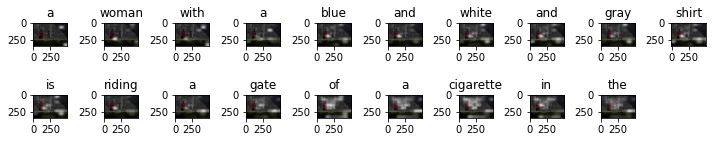


Real Captions - References:
['a', 'woman', 'holding', 'a', 'little', 'girls', 'hand', 'is', 'pointing', 'to', 'something', 'trying', 'to', 'show', 'her']
['asian', 'woman', 'holds', 'little', 'girl', "'s", 'hand', 'in', 'parklike', 'area', 'points', 'offcamera']
['a', 'woman', 'holds', 'the', 'hand', 'of', 'a', 'small', 'girl', 'and', 'points', 'towards', 'the', 'bushes']
['an', 'older', 'asian', 'lady', 'holding', 'the', 'hand', 'of', 'a', 'little', 'asian', 'girl']
['the', 'woman', 'is', 'holding', 'the', 'girls', 'hand', 'near', 'a', 'bush']
Prediction - Hypothesis:
['a', 'woman', 'is', 'sitting', 'on', 'a', 'building']
Sentence BLEU Score = 0.11844649056022646



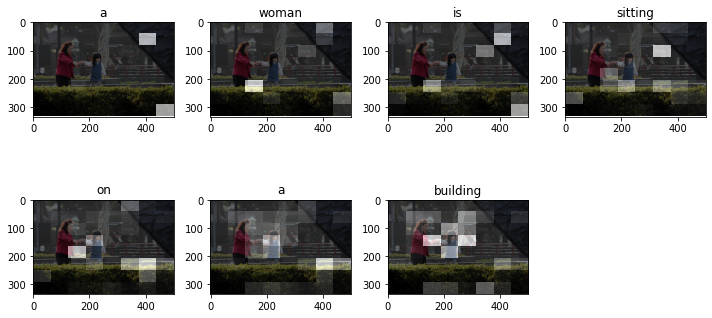


Real Captions - References:
['a', 'woman', 'holding', 'a', 'little', 'girls', 'hand', 'is', 'pointing', 'to', 'something', 'trying', 'to', 'show', 'her']
['asian', 'woman', 'holds', 'little', 'girl', "'s", 'hand', 'in', 'parklike', 'area', 'points', 'offcamera']
['a', 'woman', 'holds', 'the', 'hand', 'of', 'a', 'small', 'girl', 'and', 'points', 'towards', 'the', 'bushes']
['an', 'older', 'asian', 'lady', 'holding', 'the', 'hand', 'of', 'a', 'little', 'asian', 'girl']
['the', 'woman', 'is', 'holding', 'the', 'girls', 'hand', 'near', 'a', 'bush']
Prediction - Hypothesis:
['a', 'woman', 'is', 'sitting', 'in', 'a', 'wall']
Sentence BLEU Score = 0.12950490057023212



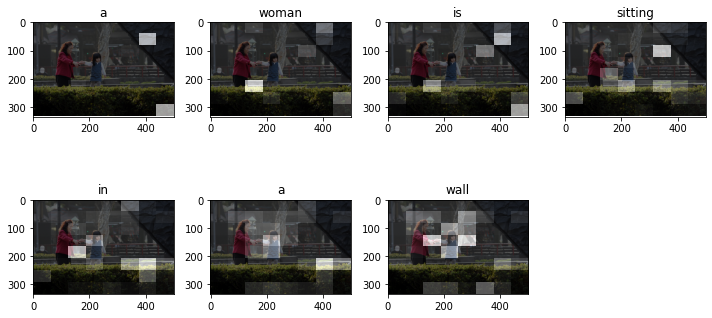


Real Captions - References:
['two', 'brown', 'dogs', 'trot', 'along', 'frozen', 'ground', 'in', 'a', 'rural', 'setting']
['two', 'golden', 'retrievers', 'running', 'in', 'a', 'slightly', 'snowy', 'desert']
['two', 'golden', 'retrievers', 'running', 'in', 'a', 'snow', 'dusted', 'field']
['two', 'dogs', 'play', 'out', 'in', 'the', 'snow', 'covered', 'grass']
['two', 'dogs', 'run', 'through', 'a', 'snowpatched', 'desert']
Prediction - Hypothesis:
['two', 'dogs', 'are', 'wearing', 'glasses', 'and', 'a', 'medium', 'white', 'and', 'large', 'black', 'and', 'white', 'aerobatic', 'fencing']
Sentence BLEU Score = 0.0519700564724535



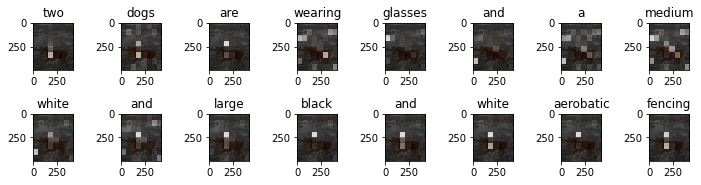


Real Captions - References:
['two', 'brown', 'dogs', 'trot', 'along', 'frozen', 'ground', 'in', 'a', 'rural', 'setting']
['two', 'golden', 'retrievers', 'running', 'in', 'a', 'slightly', 'snowy', 'desert']
['two', 'golden', 'retrievers', 'running', 'in', 'a', 'snow', 'dusted', 'field']
['two', 'dogs', 'play', 'out', 'in', 'the', 'snow', 'covered', 'grass']
['two', 'dogs', 'run', 'through', 'a', 'snowpatched', 'desert']
Prediction - Hypothesis:
['two', 'dogs', 'are', 'running', 'through', 'the', 'grass']
Sentence BLEU Score = 0.17369043747700572



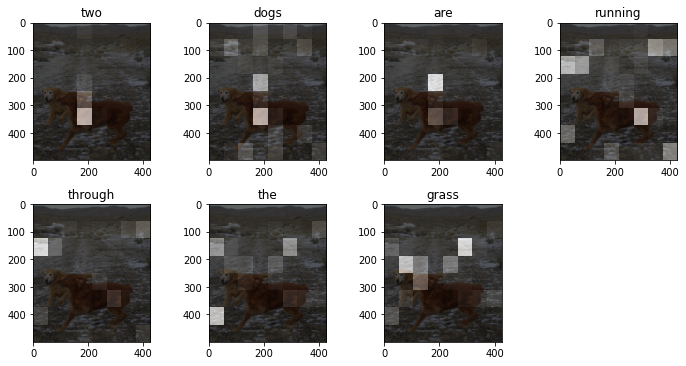


Real Captions - References:
['two', 'brown', 'dogs', 'trot', 'along', 'frozen', 'ground', 'in', 'a', 'rural', 'setting']
['two', 'golden', 'retrievers', 'running', 'in', 'a', 'slightly', 'snowy', 'desert']
['two', 'golden', 'retrievers', 'running', 'in', 'a', 'snow', 'dusted', 'field']
['two', 'dogs', 'play', 'out', 'in', 'the', 'snow', 'covered', 'grass']
['two', 'dogs', 'run', 'through', 'a', 'snowpatched', 'desert']
Prediction - Hypothesis:
['two', 'white', 'dog', 'is', 'running', 'through', 'the', 'air']
Sentence BLEU Score = 0.06317297640334663



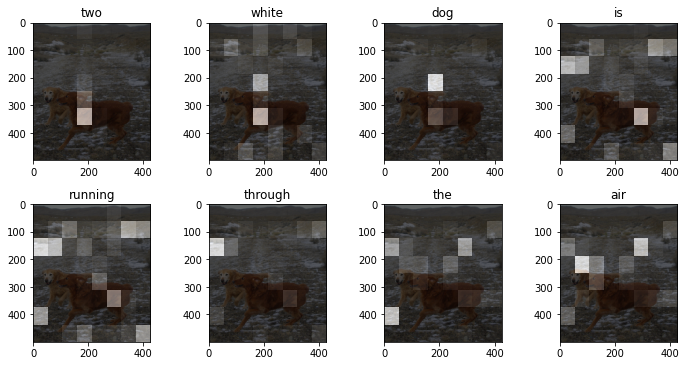


Real Captions - References:
['a', 'middleage', 'man', 'in', 'a', 'black', 'jacket', 'is', 'standing', 'on', 'a', 'boat', 'holding', 'onto', 'a', 'black', 'rope']
['a', 'man', 'waiting', 'for', 'train', 'with', 'a', 'blue', 'coat', 'blue', 'jeans', 'while', 'holing', 'a', 'rope']
['a', 'man', 'in', 'a', 'black', 'jacket', 'looking', 'over', 'the', 'railing', 'of', 'a', 'boat']
['a', 'man', 'in', 'a', 'black', 'flees', 'holds', 'ropes', 'on', 'a', 'balcony']
['a', 'man', 'in', 'black', 'stands', 'behind', 'a', 'railing']
Prediction - Hypothesis:
['two', 'men', 'at', 'a', 'public', 'white', 'bus']
Sentence BLEU Score = 0.0368530418241761



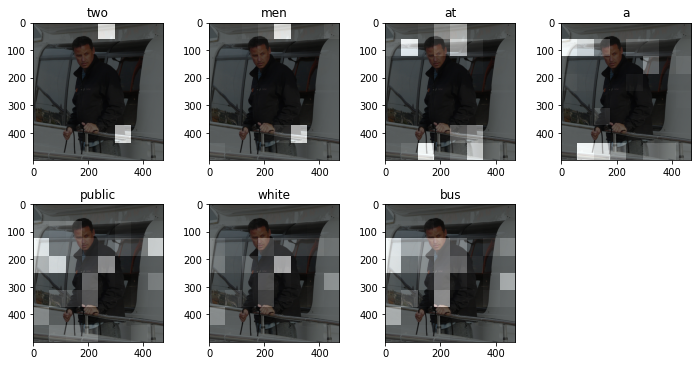


Real Captions - References:
['a', 'middleage', 'man', 'in', 'a', 'black', 'jacket', 'is', 'standing', 'on', 'a', 'boat', 'holding', 'onto', 'a', 'black', 'rope']
['a', 'man', 'waiting', 'for', 'train', 'with', 'a', 'blue', 'coat', 'blue', 'jeans', 'while', 'holing', 'a', 'rope']
['a', 'man', 'in', 'a', 'black', 'jacket', 'looking', 'over', 'the', 'railing', 'of', 'a', 'boat']
['a', 'man', 'in', 'a', 'black', 'flees', 'holds', 'ropes', 'on', 'a', 'balcony']
['a', 'man', 'in', 'black', 'stands', 'behind', 'a', 'railing']
Prediction - Hypothesis:
['two', 'women', 'are', 'standing', 'on', 'a', 'window']
Sentence BLEU Score = 0.22265417377006097



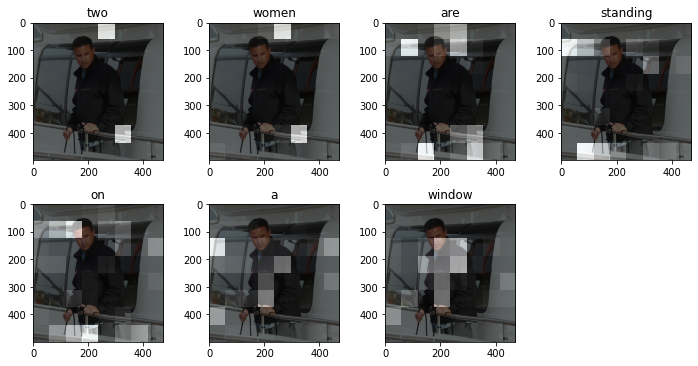


Real Captions - References:
['a', 'middleage', 'man', 'in', 'a', 'black', 'jacket', 'is', 'standing', 'on', 'a', 'boat', 'holding', 'onto', 'a', 'black', 'rope']
['a', 'man', 'waiting', 'for', 'train', 'with', 'a', 'blue', 'coat', 'blue', 'jeans', 'while', 'holing', 'a', 'rope']
['a', 'man', 'in', 'a', 'black', 'jacket', 'looking', 'over', 'the', 'railing', 'of', 'a', 'boat']
['a', 'man', 'in', 'a', 'black', 'flees', 'holds', 'ropes', 'on', 'a', 'balcony']
['a', 'man', 'in', 'black', 'stands', 'behind', 'a', 'railing']
Prediction - Hypothesis:
['two', 'men', 'sit', 'in', 'a', 'bus']
Sentence BLEU Score = 0.0969552980525137



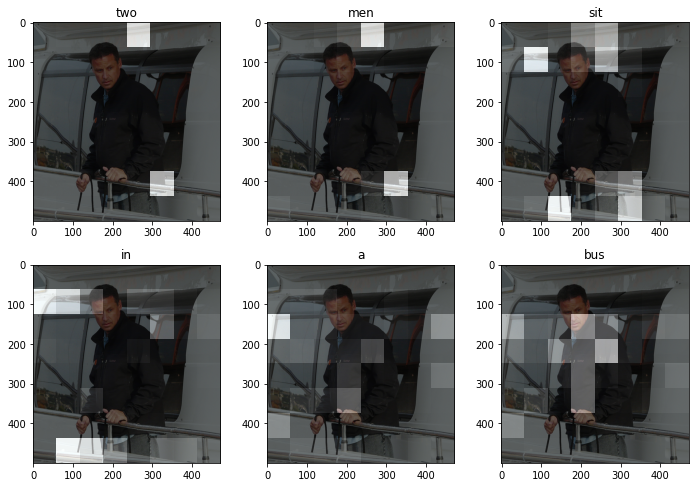


Real Captions - References:
['a', 'boy', 'wearing', 'a', 'red', 'shirt', 'is', 'bent', 'over', 'with', 'a', 'growling', 'look', 'on', 'his', 'face']
['a', 'man', 'wearing', 'a', 'red', 'shirt', 'is', 'punching', 'the', 'ground', 'while', 'looking', 'angry']
['comical', 'man', 'pushing', 'his', 'fist', 'against', 'a', 'broken', 'concrete', 'tile']
['an', 'angry', 'looking', 'man', 'pretending', 'to', 'punch', 'the', 'ground']
Prediction - Hypothesis:
['an', 'image', 'smiling', 'for', 'a', 'pink', 'jacket', 'extended', 'on', 'a', 'steps', 'for', 'a', 'tile']
Sentence BLEU Score = 0.03968722766142082



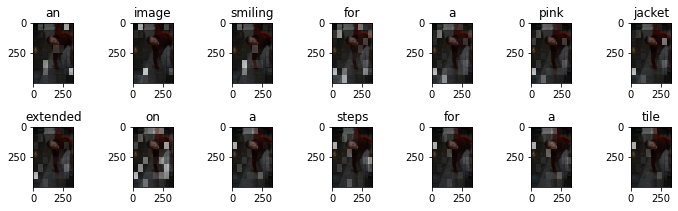


Real Captions - References:
['a', 'boy', 'wearing', 'a', 'red', 'shirt', 'is', 'bent', 'over', 'with', 'a', 'growling', 'look', 'on', 'his', 'face']
['a', 'man', 'wearing', 'a', 'red', 'shirt', 'is', 'punching', 'the', 'ground', 'while', 'looking', 'angry']
['comical', 'man', 'pushing', 'his', 'fist', 'against', 'a', 'broken', 'concrete', 'tile']
['an', 'angry', 'looking', 'man', 'pretending', 'to', 'punch', 'the', 'ground']
Prediction - Hypothesis:
['a', 'man', 'in', 'a', 'blue', 'jacket', 'is', 'sitting', 'on', 'a', 'beam']
Sentence BLEU Score = 0.10316821713567395



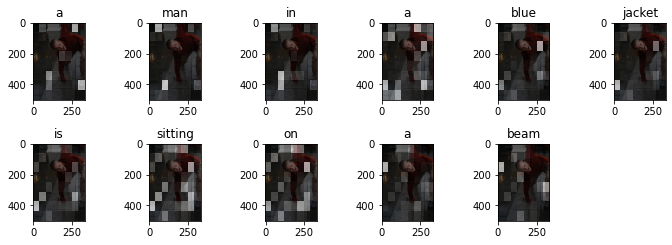


Real Captions - References:
['a', 'boy', 'wearing', 'a', 'red', 'shirt', 'is', 'bent', 'over', 'with', 'a', 'growling', 'look', 'on', 'his', 'face']
['a', 'man', 'wearing', 'a', 'red', 'shirt', 'is', 'punching', 'the', 'ground', 'while', 'looking', 'angry']
['comical', 'man', 'pushing', 'his', 'fist', 'against', 'a', 'broken', 'concrete', 'tile']
['an', 'angry', 'looking', 'man', 'pretending', 'to', 'punch', 'the', 'ground']
Prediction - Hypothesis:
['a', 'man', 'wearing', 'a', 'blue', 'jacket', 'is', 'mopping', 'a', 'box']
Sentence BLEU Score = 0.3657651481592



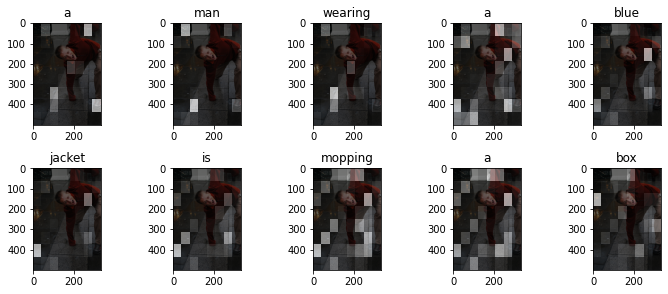

In [51]:
get_image_blue(30, "categorical")
get_image_blue(30, "greedy")
get_image_blue(30, "beam search")
get_image_blue(45, "categorical")
get_image_blue(45, "greedy")
get_image_blue(45, "beam search")
get_image_blue(140, "categorical")
get_image_blue(140, "greedy")
get_image_blue(140, "beam search")
get_image_blue(230, "categorical")
get_image_blue(230, "greedy")
get_image_blue(230, "beam search")
get_image_blue(1015, "categorical")
get_image_blue(1015, "greedy")
get_image_blue(1015, "beam search")
get_image_blue(1150, "categorical")
get_image_blue(1150, "greedy")
get_image_blue(1150, "beam search")
get_image_blue(195, "categorical")
get_image_blue(195, "greedy")
get_image_blue(195, "beam search")

In [69]:
get_vocab_blue(100, "categorical")

get_vocab_blue(100, "greedy")

get_vocab_blue(100, "beam search")

Corpus BLEU Score categorical:  0.15814124450766283
Corpus BLEU Score greedy:  0.16313894851298108
Corpus BLEU Score beam search:  0.16873847468370562


### LSTM results

In [65]:
decoder = RNN_Decoder(embedding_dim, units, vocabulary_size, False)
train_model()

Epoch 1 Batch 0 Loss 7.5046
Epoch 1 Batch 100 Loss 3.2671
Epoch 1 Batch 200 Loss 2.6493
Epoch 1 Batch 300 Loss 2.7462
Epoch 1 Loss 3.063547
Time taken for 1 epoch 156.91 sec

Epoch 2 Batch 0 Loss 2.5825
Epoch 2 Batch 100 Loss 2.5337
Epoch 2 Batch 200 Loss 2.4276
Epoch 2 Batch 300 Loss 2.3349
Epoch 2 Loss 2.430384
Time taken for 1 epoch 157.78 sec

Epoch 3 Batch 0 Loss 2.6269
Epoch 3 Batch 100 Loss 2.2053
Epoch 3 Batch 200 Loss 2.5127
Epoch 3 Batch 300 Loss 2.3448
Epoch 3 Loss 2.239191
Time taken for 1 epoch 156.89 sec

Epoch 4 Batch 0 Loss 2.1214
Epoch 4 Batch 100 Loss 2.2321
Epoch 4 Batch 200 Loss 2.0889
Epoch 4 Batch 300 Loss 2.0687
Epoch 4 Loss 2.114228
Time taken for 1 epoch 158.98 sec

Epoch 5 Batch 0 Loss 2.1201
Epoch 5 Batch 100 Loss 1.8244
Epoch 5 Batch 200 Loss 1.9712
Epoch 5 Batch 300 Loss 2.0716
Epoch 5 Loss 2.013931
Time taken for 1 epoch 156.64 sec

Epoch 6 Batch 0 Loss 2.0494
Epoch 6 Batch 100 Loss 1.8979
Epoch 6 Batch 200 Loss 1.9596
Epoch 6 Batch 300 Loss 1.8211
Epoch 6

Real Captions - References:
['young', 'boy', 'and', 'girl', 'squeeze', 'tubes', 'of', 'frosting', 'onto', 'cupcakes', 'with', 'adults', 'around', 'them']
['two', 'little', 'kids', 'are', 'decorating', 'cupcakes', 'with', 'tubes', 'of', 'frosting']
['a', 'boy', 'and', 'girl', 'putting', 'frosting', 'on', 'cupcake']
['two', 'children', 'icing', 'their', 'cupcakes']
['two', 'children', 'decorate', 'cupcakes']
Prediction - Hypothesis:
['two', 'young', 'children', 'are', 'holding', 'a', 'drink', 'and', 'plays', 'brunettes']
Sentence BLEU Score = 0.057525439568354694



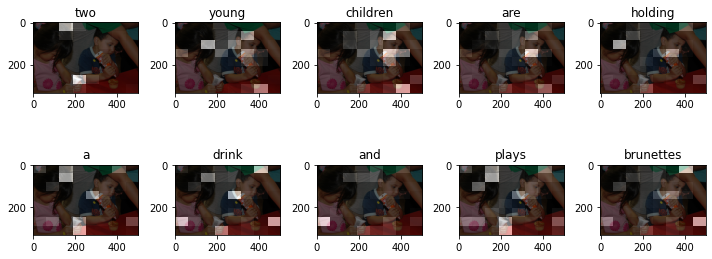


Real Captions - References:
['young', 'boy', 'and', 'girl', 'squeeze', 'tubes', 'of', 'frosting', 'onto', 'cupcakes', 'with', 'adults', 'around', 'them']
['two', 'little', 'kids', 'are', 'decorating', 'cupcakes', 'with', 'tubes', 'of', 'frosting']
['a', 'boy', 'and', 'girl', 'putting', 'frosting', 'on', 'cupcake']
['two', 'children', 'icing', 'their', 'cupcakes']
['two', 'children', 'decorate', 'cupcakes']
Prediction - Hypothesis:
['two', 'young', 'children', 'are', 'in', 'a', 'red', 'umbrella']
Sentence BLEU Score = 0.06907093649753285



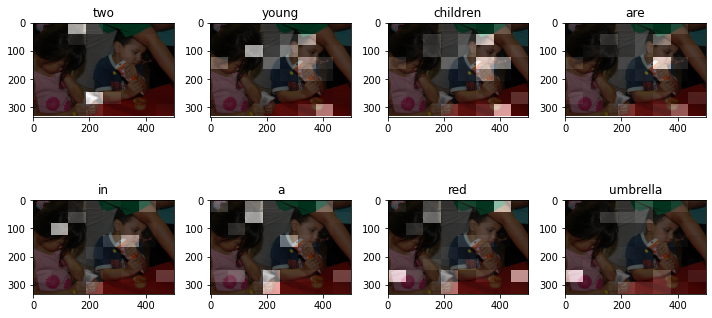


Real Captions - References:
['young', 'boy', 'and', 'girl', 'squeeze', 'tubes', 'of', 'frosting', 'onto', 'cupcakes', 'with', 'adults', 'around', 'them']
['two', 'little', 'kids', 'are', 'decorating', 'cupcakes', 'with', 'tubes', 'of', 'frosting']
['a', 'boy', 'and', 'girl', 'putting', 'frosting', 'on', 'cupcake']
['two', 'children', 'icing', 'their', 'cupcakes']
['two', 'children', 'decorate', 'cupcakes']
Prediction - Hypothesis:
['two', 'kids', 'are', 'playing', 'in', 'a', 'white', 'umbrella']
Sentence BLEU Score = 0.12604665914201577



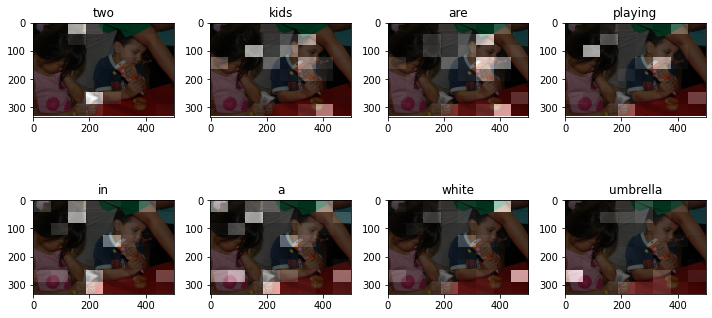


Real Captions - References:
['many', 'people', 'stand', 'by', 'as', 'a', 'man', 'cuts', 'a', 'piece', 'of', 'plywood', 'at', 'a', 'construction', 'site']
['a', 'group', 'of', 'people', 'outside', 'with', 'boards', 'and', 'construction', 'tools']
['a', 'man', 'measures', 'wood', 'while', 'a', 'group', 'of', 'people', 'looks', 'on']
['eight', 'people', 'gathered', 'around', 'a', 'man', 'cutting', 'some', 'wood']
Prediction - Hypothesis:
['a', 'plank', 'booth']
Sentence BLEU Score = 0.017793178500730117



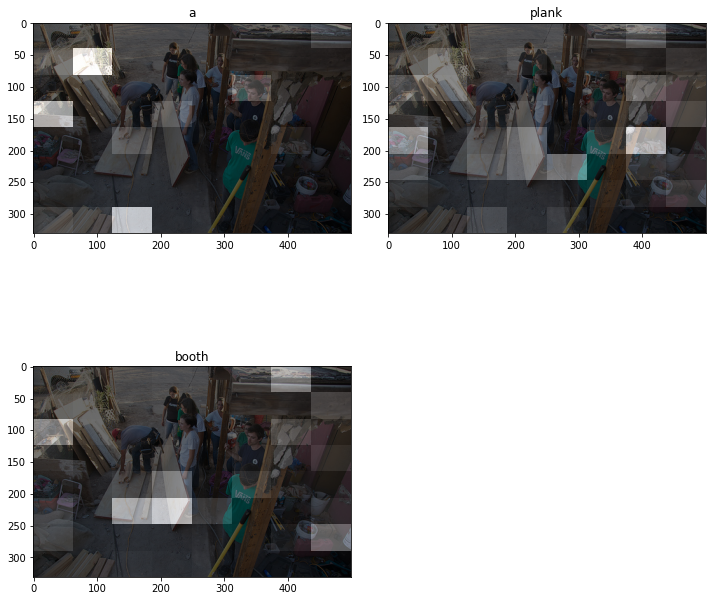


Real Captions - References:
['many', 'people', 'stand', 'by', 'as', 'a', 'man', 'cuts', 'a', 'piece', 'of', 'plywood', 'at', 'a', 'construction', 'site']
['a', 'group', 'of', 'people', 'outside', 'with', 'boards', 'and', 'construction', 'tools']
['a', 'man', 'measures', 'wood', 'while', 'a', 'group', 'of', 'people', 'looks', 'on']
['eight', 'people', 'gathered', 'around', 'a', 'man', 'cutting', 'some', 'wood']
Prediction - Hypothesis:
['a', 'man', 'is', 'working', 'on', 'a', 'boat']
Sentence BLEU Score = 0.11098269528529414



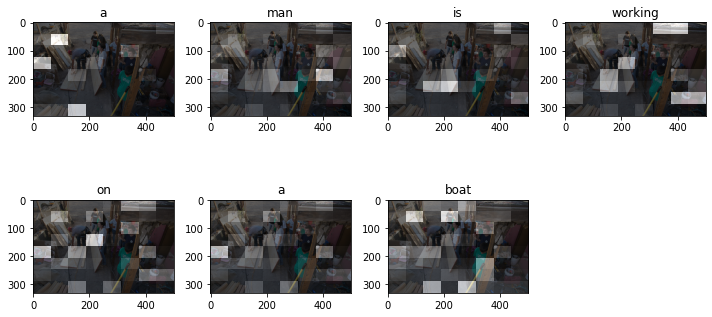


Real Captions - References:
['many', 'people', 'stand', 'by', 'as', 'a', 'man', 'cuts', 'a', 'piece', 'of', 'plywood', 'at', 'a', 'construction', 'site']
['a', 'group', 'of', 'people', 'outside', 'with', 'boards', 'and', 'construction', 'tools']
['a', 'man', 'measures', 'wood', 'while', 'a', 'group', 'of', 'people', 'looks', 'on']
['eight', 'people', 'gathered', 'around', 'a', 'man', 'cutting', 'some', 'wood']
Prediction - Hypothesis:
['a', 'group', 'of', 'people', 'are', 'looking', 'at', 'a', 'river']
Sentence BLEU Score = 0.4493924416938432



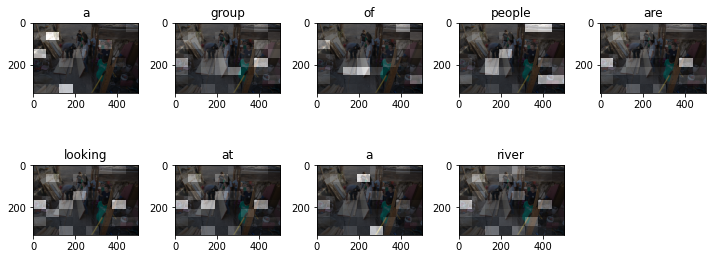


Real Captions - References:
['a', 'man', 'is', 'parking', 'his', 'bicycle', 'outside', 'a', 'building', 'next', 'to', 'a', 'statue', 'of', 'a', 'man', "'s", 'head']
['male', 'wearing', 'a', 'helmet', 'and', 'backpack', 'holding', 'his', 'bike', 'up', 'in', 'front', 'of', 'a', 'store']
['a', 'man', 'walks', 'his', 'bike', 'past', 'a', 'large', 'silver', 'sculpture', 'of', 'a', 'head']
['a', 'man', 'stopping', 'with', 'his', 'bike', 'by', 'a', 'strange', 'statue']
Prediction - Hypothesis:
['a', 'man', 'looking', 'down', 'the', 'street']
Sentence BLEU Score = 0.06947150678063999



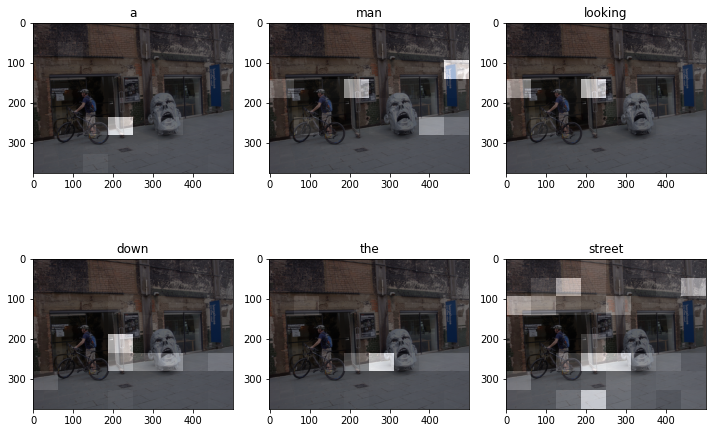


Real Captions - References:
['a', 'man', 'is', 'parking', 'his', 'bicycle', 'outside', 'a', 'building', 'next', 'to', 'a', 'statue', 'of', 'a', 'man', "'s", 'head']
['male', 'wearing', 'a', 'helmet', 'and', 'backpack', 'holding', 'his', 'bike', 'up', 'in', 'front', 'of', 'a', 'store']
['a', 'man', 'walks', 'his', 'bike', 'past', 'a', 'large', 'silver', 'sculpture', 'of', 'a', 'head']
['a', 'man', 'stopping', 'with', 'his', 'bike', 'by', 'a', 'strange', 'statue']
Prediction - Hypothesis:
['a', 'man', 'is', 'walking', 'down', 'a', 'street']
Sentence BLEU Score = 0.18772503655981246



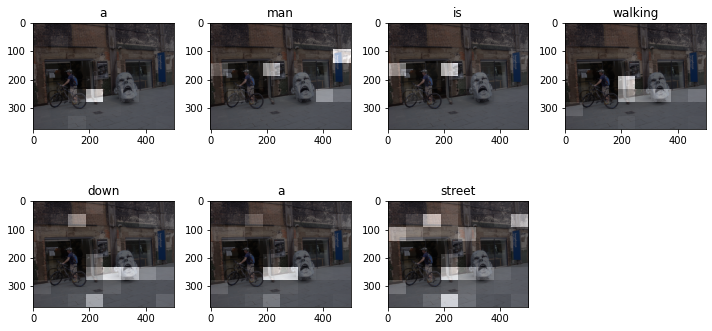


Real Captions - References:
['a', 'man', 'is', 'parking', 'his', 'bicycle', 'outside', 'a', 'building', 'next', 'to', 'a', 'statue', 'of', 'a', 'man', "'s", 'head']
['male', 'wearing', 'a', 'helmet', 'and', 'backpack', 'holding', 'his', 'bike', 'up', 'in', 'front', 'of', 'a', 'store']
['a', 'man', 'walks', 'his', 'bike', 'past', 'a', 'large', 'silver', 'sculpture', 'of', 'a', 'head']
['a', 'man', 'stopping', 'with', 'his', 'bike', 'by', 'a', 'strange', 'statue']
Prediction - Hypothesis:
['a', 'woman', 'in', 'a', 'street']
Sentence BLEU Score = 0.03722380550553181



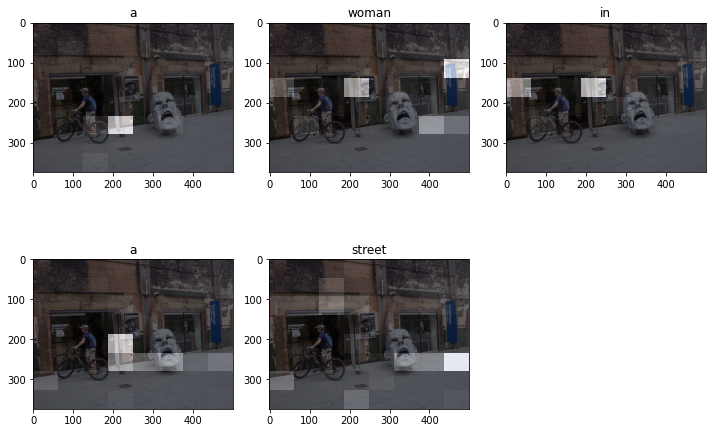


Real Captions - References:
['a', 'woman', 'holding', 'a', 'little', 'girls', 'hand', 'is', 'pointing', 'to', 'something', 'trying', 'to', 'show', 'her']
['asian', 'woman', 'holds', 'little', 'girl', "'s", 'hand', 'in', 'parklike', 'area', 'points', 'offcamera']
['a', 'woman', 'holds', 'the', 'hand', 'of', 'a', 'small', 'girl', 'and', 'points', 'towards', 'the', 'bushes']
['an', 'older', 'asian', 'lady', 'holding', 'the', 'hand', 'of', 'a', 'little', 'asian', 'girl']
['the', 'woman', 'is', 'holding', 'the', 'girls', 'hand', 'near', 'a', 'bush']
Prediction - Hypothesis:
['woman', 'talks', 'to', 'see']
Sentence BLEU Score = 0.026595239357540598



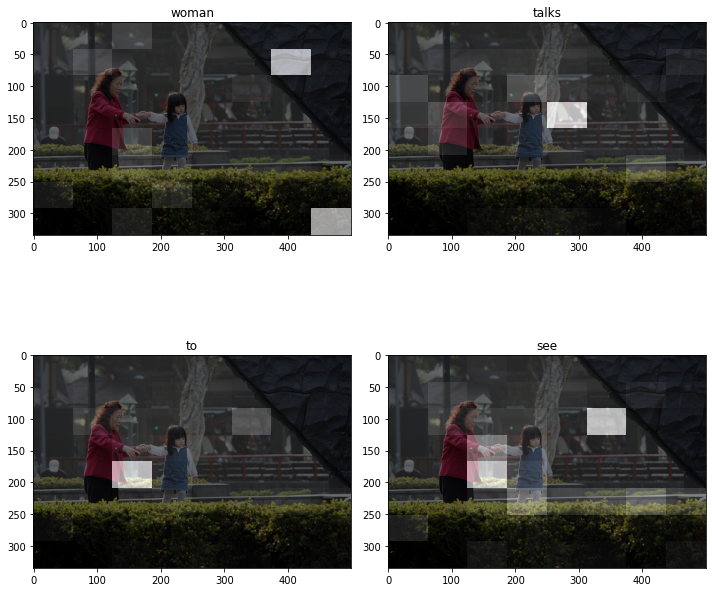


Real Captions - References:
['a', 'woman', 'holding', 'a', 'little', 'girls', 'hand', 'is', 'pointing', 'to', 'something', 'trying', 'to', 'show', 'her']
['asian', 'woman', 'holds', 'little', 'girl', "'s", 'hand', 'in', 'parklike', 'area', 'points', 'offcamera']
['a', 'woman', 'holds', 'the', 'hand', 'of', 'a', 'small', 'girl', 'and', 'points', 'towards', 'the', 'bushes']
['an', 'older', 'asian', 'lady', 'holding', 'the', 'hand', 'of', 'a', 'little', 'asian', 'girl']
['the', 'woman', 'is', 'holding', 'the', 'girls', 'hand', 'near', 'a', 'bush']
Prediction - Hypothesis:
['a', 'man', 'is', 'walking', 'down']
Sentence BLEU Score = 0.03165076903218965



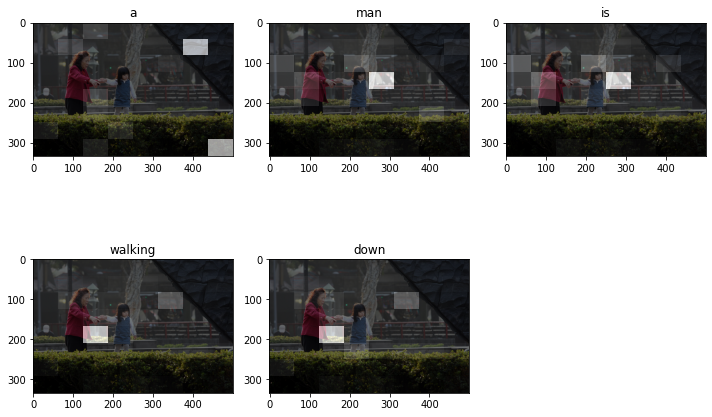


Real Captions - References:
['a', 'woman', 'holding', 'a', 'little', 'girls', 'hand', 'is', 'pointing', 'to', 'something', 'trying', 'to', 'show', 'her']
['asian', 'woman', 'holds', 'little', 'girl', "'s", 'hand', 'in', 'parklike', 'area', 'points', 'offcamera']
['a', 'woman', 'holds', 'the', 'hand', 'of', 'a', 'small', 'girl', 'and', 'points', 'towards', 'the', 'bushes']
['an', 'older', 'asian', 'lady', 'holding', 'the', 'hand', 'of', 'a', 'little', 'asian', 'girl']
['the', 'woman', 'is', 'holding', 'the', 'girls', 'hand', 'near', 'a', 'bush']
Prediction - Hypothesis:
['a', 'man', 'is', 'sitting', 'on', 'a', 'tree', 'branch']
Sentence BLEU Score = 0.04385127488524627



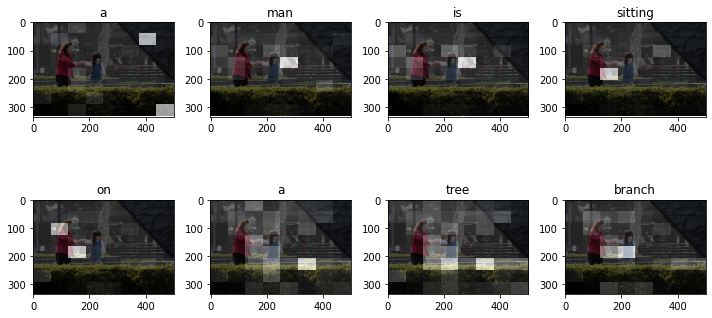


Real Captions - References:
['two', 'brown', 'dogs', 'trot', 'along', 'frozen', 'ground', 'in', 'a', 'rural', 'setting']
['two', 'golden', 'retrievers', 'running', 'in', 'a', 'slightly', 'snowy', 'desert']
['two', 'golden', 'retrievers', 'running', 'in', 'a', 'snow', 'dusted', 'field']
['two', 'dogs', 'play', 'out', 'in', 'the', 'snow', 'covered', 'grass']
['two', 'dogs', 'run', 'through', 'a', 'snowpatched', 'desert']
Prediction - Hypothesis:
['a', 'brown', 'dog', 'runs']
Sentence BLEU Score = 0.056302122161731506



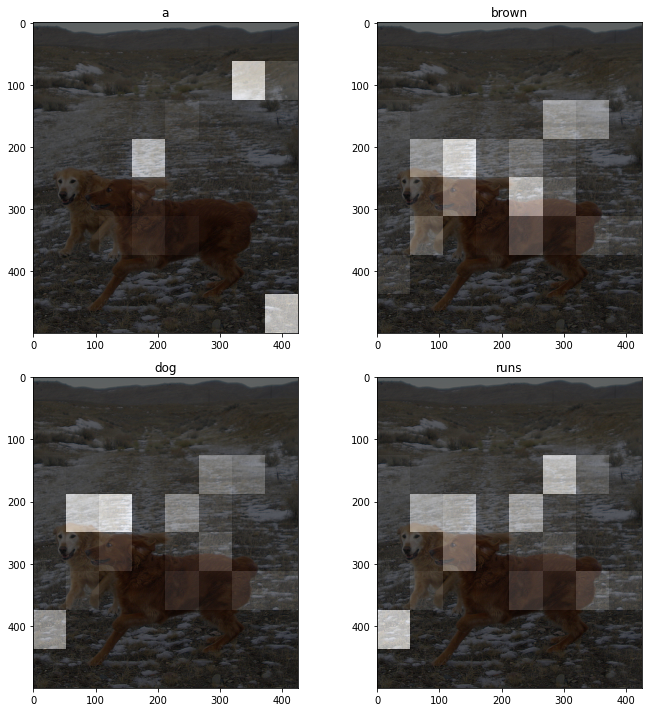


Real Captions - References:
['two', 'brown', 'dogs', 'trot', 'along', 'frozen', 'ground', 'in', 'a', 'rural', 'setting']
['two', 'golden', 'retrievers', 'running', 'in', 'a', 'slightly', 'snowy', 'desert']
['two', 'golden', 'retrievers', 'running', 'in', 'a', 'snow', 'dusted', 'field']
['two', 'dogs', 'play', 'out', 'in', 'the', 'snow', 'covered', 'grass']
['two', 'dogs', 'run', 'through', 'a', 'snowpatched', 'desert']
Prediction - Hypothesis:
['a', 'brown', 'dog', 'is', 'running', 'through', 'the', 'water']
Sentence BLEU Score = 0.06907093649753285



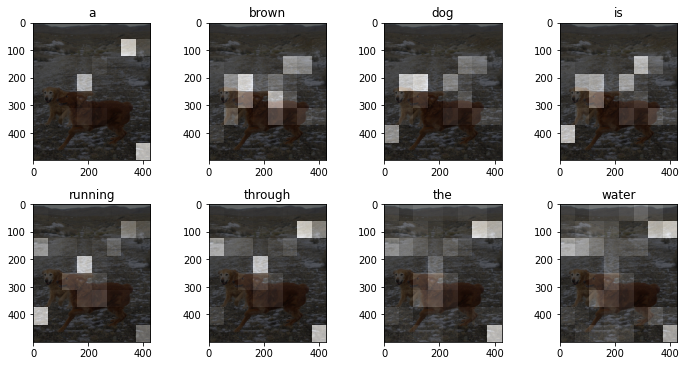


Real Captions - References:
['two', 'brown', 'dogs', 'trot', 'along', 'frozen', 'ground', 'in', 'a', 'rural', 'setting']
['two', 'golden', 'retrievers', 'running', 'in', 'a', 'slightly', 'snowy', 'desert']
['two', 'golden', 'retrievers', 'running', 'in', 'a', 'snow', 'dusted', 'field']
['two', 'dogs', 'play', 'out', 'in', 'the', 'snow', 'covered', 'grass']
['two', 'dogs', 'run', 'through', 'a', 'snowpatched', 'desert']
Prediction - Hypothesis:
['a', 'brown', 'dog', 'is', 'running', 'in', 'the', 'water']
Sentence BLEU Score = 0.16966971999266772



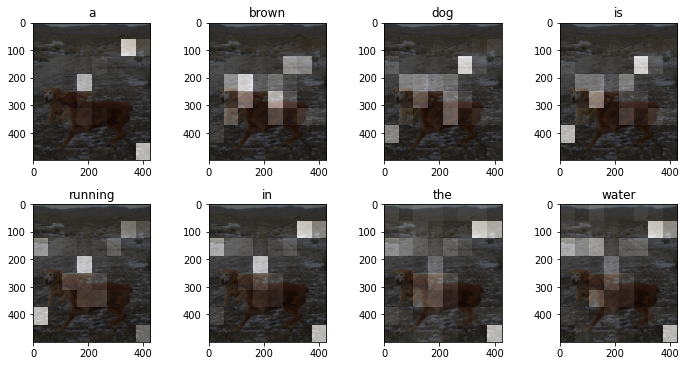


Real Captions - References:
['a', 'middleage', 'man', 'in', 'a', 'black', 'jacket', 'is', 'standing', 'on', 'a', 'boat', 'holding', 'onto', 'a', 'black', 'rope']
['a', 'man', 'waiting', 'for', 'train', 'with', 'a', 'blue', 'coat', 'blue', 'jeans', 'while', 'holing', 'a', 'rope']
['a', 'man', 'in', 'a', 'black', 'jacket', 'looking', 'over', 'the', 'railing', 'of', 'a', 'boat']
['a', 'man', 'in', 'a', 'black', 'flees', 'holds', 'ropes', 'on', 'a', 'balcony']
['a', 'man', 'in', 'black', 'stands', 'behind', 'a', 'railing']
Prediction - Hypothesis:
['two', 'construction', 'workers', 'train', 'on', 'the', 'bus', 'looking', 'at', 'each', 'of', 'a', 'window']
Sentence BLEU Score = 0.08583220081798415



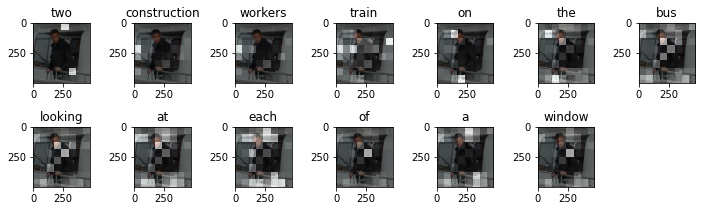


Real Captions - References:
['a', 'middleage', 'man', 'in', 'a', 'black', 'jacket', 'is', 'standing', 'on', 'a', 'boat', 'holding', 'onto', 'a', 'black', 'rope']
['a', 'man', 'waiting', 'for', 'train', 'with', 'a', 'blue', 'coat', 'blue', 'jeans', 'while', 'holing', 'a', 'rope']
['a', 'man', 'in', 'a', 'black', 'jacket', 'looking', 'over', 'the', 'railing', 'of', 'a', 'boat']
['a', 'man', 'in', 'a', 'black', 'flees', 'holds', 'ropes', 'on', 'a', 'balcony']
['a', 'man', 'in', 'black', 'stands', 'behind', 'a', 'railing']
Prediction - Hypothesis:
['two', 'men', 'are', 'looking', 'at', 'a', 'train']
Sentence BLEU Score = 0.057190229840165294



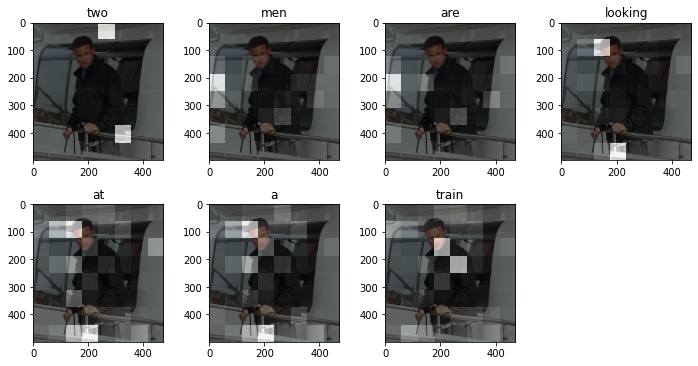


Real Captions - References:
['a', 'middleage', 'man', 'in', 'a', 'black', 'jacket', 'is', 'standing', 'on', 'a', 'boat', 'holding', 'onto', 'a', 'black', 'rope']
['a', 'man', 'waiting', 'for', 'train', 'with', 'a', 'blue', 'coat', 'blue', 'jeans', 'while', 'holing', 'a', 'rope']
['a', 'man', 'in', 'a', 'black', 'jacket', 'looking', 'over', 'the', 'railing', 'of', 'a', 'boat']
['a', 'man', 'in', 'a', 'black', 'flees', 'holds', 'ropes', 'on', 'a', 'balcony']
['a', 'man', 'in', 'black', 'stands', 'behind', 'a', 'railing']
Prediction - Hypothesis:
['two', 'men', 'are', 'looking', 'at', 'a', 'bus']
Sentence BLEU Score = 0.048627880223044685



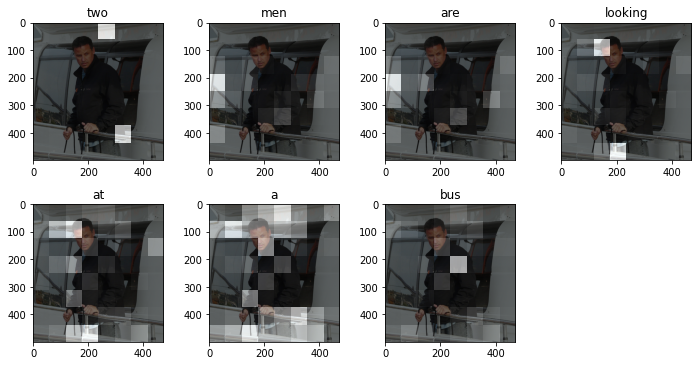


Real Captions - References:
['a', 'boy', 'wearing', 'a', 'red', 'shirt', 'is', 'bent', 'over', 'with', 'a', 'growling', 'look', 'on', 'his', 'face']
['a', 'man', 'wearing', 'a', 'red', 'shirt', 'is', 'punching', 'the', 'ground', 'while', 'looking', 'angry']
['comical', 'man', 'pushing', 'his', 'fist', 'against', 'a', 'broken', 'concrete', 'tile']
['an', 'angry', 'looking', 'man', 'pretending', 'to', 'punch', 'the', 'ground']
Prediction - Hypothesis:
['a', 'uses', 'fishing', 'shovel', 'out', 'side', 'another', 'arm']
Sentence BLEU Score = 0.03201994137590339



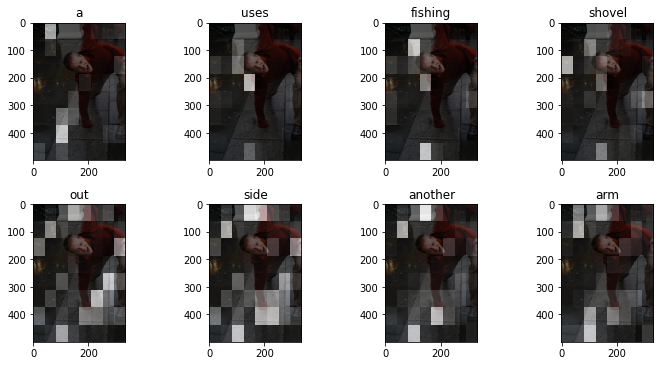


Real Captions - References:
['a', 'boy', 'wearing', 'a', 'red', 'shirt', 'is', 'bent', 'over', 'with', 'a', 'growling', 'look', 'on', 'his', 'face']
['a', 'man', 'wearing', 'a', 'red', 'shirt', 'is', 'punching', 'the', 'ground', 'while', 'looking', 'angry']
['comical', 'man', 'pushing', 'his', 'fist', 'against', 'a', 'broken', 'concrete', 'tile']
['an', 'angry', 'looking', 'man', 'pretending', 'to', 'punch', 'the', 'ground']
Prediction - Hypothesis:
['a', 'woman', 'in', 'jeans', 'and', 'jeans', 'and', 'jeans', 'and', 'jeans', 'and', 'jeans', 'and', 'jeans', 'and', 'jeans', 'and', 'jeans', 'and']
Sentence BLEU Score = 0.013977034126456678



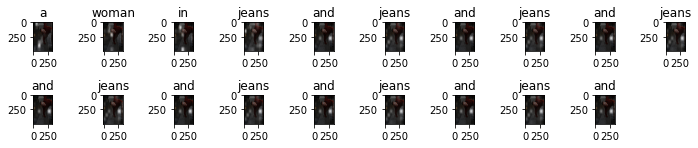


Real Captions - References:
['a', 'boy', 'wearing', 'a', 'red', 'shirt', 'is', 'bent', 'over', 'with', 'a', 'growling', 'look', 'on', 'his', 'face']
['a', 'man', 'wearing', 'a', 'red', 'shirt', 'is', 'punching', 'the', 'ground', 'while', 'looking', 'angry']
['comical', 'man', 'pushing', 'his', 'fist', 'against', 'a', 'broken', 'concrete', 'tile']
['an', 'angry', 'looking', 'man', 'pretending', 'to', 'punch', 'the', 'ground']
Prediction - Hypothesis:
['a', 'woman', 'wearing', 'an', 'orange', 'jacket', 'and', 'jeans', 'and', 'jeans', 'and', 'red', 'jacket', 'and', 'jeans', 'sitting', 'on', 'the', 'sidewalk']
Sentence BLEU Score = 0.0286203885671615



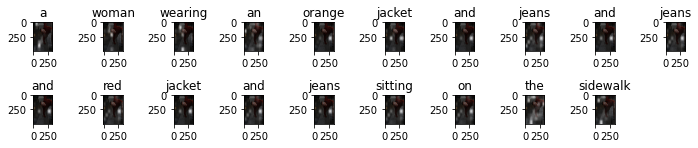

In [56]:
get_image_blue(30, "categorical")
get_image_blue(30, "greedy")
get_image_blue(30, "beam search")
get_image_blue(45, "categorical")
get_image_blue(45, "greedy")
get_image_blue(45, "beam search")
get_image_blue(140, "categorical")
get_image_blue(140, "greedy")
get_image_blue(140, "beam search")
get_image_blue(230, "categorical")
get_image_blue(230, "greedy")
get_image_blue(230, "beam search")
get_image_blue(1015, "categorical")
get_image_blue(1015, "greedy")
get_image_blue(1015, "beam search")
get_image_blue(1150, "categorical")
get_image_blue(1150, "greedy")
get_image_blue(1150, "beam search")
get_image_blue(195, "categorical")
get_image_blue(195, "greedy")
get_image_blue(195, "beam search")

In [70]:
get_vocab_blue(100, "categorical")

get_vocab_blue(100, "greedy")

get_vocab_blue(100, "beam search")

Corpus BLEU Score categorical:  0.161512151483841884
Corpus BLEU Score greedy:  0.1728795506830792
Corpus BLEU Score beam search:  0.17440032005428585


#### Παραπάνω υπολογίστηκε το  image bleu για αρκετά δείγματα εικόνων, τόσο για το μοντέλο inceptionV3 όσο και για το ResNet152V2. To μοντέλο inceptionV3 απέδιδε, γενικά, υψηλότερα scores έναντι του inceptionV3. Έπειτα, έγινε δοκιμή των επιδόσεων του βελτιστοποιημένου μοντέλου, ResNet152V2, για GRU και LSTM decoder, αρχικά σε 512 και έπειτα σε 256 units. Tο LSTM μοντέλο, παρουσιάζει μικρότερο training loss και αποδίδει καλύτερα του GRU, σημειώνοντας υψηλότερα bleu scores. Οι επιδόσεις και των δύο μοντέλων στα 256 είναι χειρότερες από τις αντίστοιχες στα 512, γεγονός που αποτυπώνεται και ως υψηλότερο training loss και ως χαμηλότερο bleu score. Όσο αφορά τους τρόπους υπολογισμού των επόμενων λέξεων, παρατηρούμε πως υψηλότερο score, στην συντριπτική πειονότητα των περιπτώσεων, σημειώνει η μέθοδος beam search, έπειτα η greedy και τέλος η categorical. Εν κατακλείδι, για τον υπολογισμό του captioning περισσότερων εικόνων, χρησιμοποιήθηκε δείγμα 100 εικόνων, έγινε χρήση της συνάρτησης **corpus_blue**. Αποδίδονται συγκεντρωτικά, τα scores που εξήχθησαν παραπάνω:

#### InceptionV3, GRU, units 512: 0.1722
#### ResNet152V2, GRU, units 512: 0.2321, 0.2792, 0.2866 (Σειρά categorical, greedy, beam search)
#### ResNet152V2, LSTM, units 512: 0.2455, 0.2789, 0.2599

#### ResNet152V2, GRU, units 256: 0.1581, 0.1631, 0.1687 (Σειρά categorical, greedy, beam search)
#### ResNet152V2, LSTM, units 256: 0.1615, 0.1729, 0.1744
#### από όπου φαίνεται ότι το ResNet152V2 αποδίδει καλύτερα του InceptionV3, οι επιδόσεις με 512 units είναι καλύτερες, εν γένει τα LSTMs αποδίδουν καλύτερα από τα GRUs και η σειρά απόδοσης για τους τρόπους πρόβλεψης λέξεων είναι  beam search, greedy, categorical, από καλύτερη σε χειρότερη.